In [ ]:
import requests
import pandas as pd
import json
from datetime import datetime
import os

def fetch_usgs_earthquake_data(start_time, end_time, min_magnitude, min_latitude, max_latitude, min_longitude, max_longitude):
    base_url = "https://earthquake.usgs.gov/fdsnws/event/1/query"

    params = {
        "format": "geojson",
        "starttime": start_time,
        "endtime": end_time,
        "minmagnitude": min_magnitude,
        "minlatitude": min_latitude,
        "maxlatitude": max_latitude,
        "minlongitude": min_longitude,
        "maxlongitude": max_longitude,
        "orderby": "time"
    }

    print(f"Fetching earthquake data from {start_time} to {end_time}...")
    response = requests.get(base_url, params=params)
    response.raise_for_status()

    data = response.json()
    print(f"Successfully fetched {len(data['features'])} earthquakes")
    return data

def geojson_to_dataframe(geojson_data):
    features = geojson_data['features']

    earthquakes = []
    for feature in features:
        props = feature['properties']
        coords = feature['geometry']['coordinates']

        earthquake = {
            'id': feature['id'],
            'time': datetime.fromtimestamp(props['time'] / 1000).strftime('%Y-%m-%d %H:%M:%S'),
            'place': props.get('place'),
            'magnitude': props.get('mag'),
            'depth_km': coords[2],
            'longitude': coords[0],
            'latitude': coords[1]
        }
        earthquakes.append(earthquake)

    return pd.DataFrame(earthquakes)

def main():

    start_time = "2020-01-01"
    end_time = "2025-04-28"
    min_magnitude = 4.5
    min_latitude = -11.0
    max_latitude = 6.0
    min_longitude = 95.0
    max_longitude = 141.0

    output_csv = "data_gempa.csv"


    geojson_data = fetch_usgs_earthquake_data(
        start_time, end_time, min_magnitude,
        min_latitude, max_latitude, min_longitude, max_longitude
    )

    # Convert ke DataFrame
    df = geojson_to_dataframe(geojson_data)

    df.to_csv(output_csv, index=False)
    print(f"\nCSV berhasil dibuat: {output_csv}")
    print(f"Total earthquakes saved: {len(df)}")

if __name__ == "__main__":
    main()

Fetching earthquake data from 2020-01-01 to 2025-04-28...
Successfully fetched 4594 earthquakes

CSV berhasil dibuat: data_gempa.csv
Total earthquakes saved: 4594


# Analisis Clustering Spasial Gempa Bumi per Provinsi di Indonesia

Notebook ini berisi analisis clustering spasial menggunakan algoritma DBSCAN dan OPTICS pada dataset gempa bumi di Indonesia, dengan pengelompokan berdasarkan provinsi.

## 1. Import Library yang Diperlukan

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from shapely.geometry import Point
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, OPTICS
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
import warnings
warnings.filterwarnings('ignore')

# Set style untuk visualisasi
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

## 2. Load dan Eksplorasi Data

### 2.1 Load Dataset Gempa

In [ ]:
# Load dataset gempa
df = pd.read_csv('data_gempa.csv')

# Tampilkan beberapa baris pertama
df.head()

,id,time,place,magnitude,depth_km,longitude,latitude
0,us7000pvgi,2025-04-27 22:13:45,"54 km SSW of Modisi, Indonesia",4.5,89.601,124.2330,0.0015
1,us7000pyvc,2025-04-26 16:27:41,"224 km NW of Tobelo, Indonesia",4.5,50.398,126.7872,3.3479
2,us7000pv70,2025-04-26 06:33:17,"110 km S of Abepura, Indonesia",4.9,35.000,140.5176,-3.5924
3,us7000pv4p,2025-04-25 21:19:50,"102 km W of Gorontalo, Indonesia",4.5,135.303,122.1611,0.3650
4,us7000pv1k,2025-04-25 15:59:44,"167 km NNW of Maubara, Timor Leste",4.5,503.140,124.7866,-7.1594


In [ ]:
# Tampilkan informasi dasar dataset
print("Informasi Dataset:")
print(f"Jumlah data: {df.shape[0]}")
print(f"Jumlah kolom: {df.shape[1]}")
print("\nInformasi kolom:")
df.info()

Informasi Dataset:
Jumlah data: 4594
Jumlah kolom: 7

Informasi kolom:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4594 entries, 0 to 4593
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         4594 non-null   object 
 1   time       4594 non-null   object 
 2   place      4594 non-null   object 
 3   magnitude  4594 non-null   float64
 4   depth_km   4594 non-null   float64
 5   longitude  4594 non-null   float64
 6   latitude   4594 non-null   float64
dtypes: float64(4), object(3)
memory usage: 251.4+ KB


In [ ]:
# Tampilkan statistik deskriptif
df.describe()

,magnitude,depth_km,longitude,latitude
count,4594.000000,4594.000000,4594.000000,4594.000000
mean,4.780997,72.387867,121.719845,-2.424186
std,0.354263,95.660557,11.365490,4.642879
min,4.500000,3.604000,95.024900,-10.999500
25%,4.500000,10.000000,117.827500,-6.688825
50%,4.700000,42.271000,126.317300,-2.772300
75%,4.900000,94.186750,128.576525,1.657700
max,7.600000,650.655000,140.942900,5.999400


In [ ]:
# Cek missing values
print("\nJumlah missing values per kolom:")
df.isnull().sum()


Jumlah missing values per kolom:


,0
id,0
time,0
place,0
magnitude,0
depth_km,0
longitude,0
latitude,0


### 2.2 Download dan Load Data Batas Provinsi Indonesia

In [ ]:
# Download data batas provinsi Indonesia dari GitHub
# Jika file sudah ada, kode ini bisa dilewati
import os
import requests

# URL untuk file GeoJSON batas provinsi Indonesia
url = "https://raw.githubusercontent.com/superpikar/indonesia-geojson/master/indonesia-province.json"
output_file = "indonesia-province.json"

# Download file jika belum ada
if not os.path.exists(output_file):
    print(f"Downloading {output_file}...")
    response = requests.get(url)
    with open(output_file, 'wb') as f:
        f.write(response.content)
    print("Download selesai.")
else:
    print(f"File {output_file} sudah ada.")

Download selesai.


In [ ]:
# Load data batas provinsi Indonesia
provinces = gpd.read_file("indonesia-province.json")

# Tampilkan informasi dasar
print(f"Jumlah provinsi: {len(provinces)}")
print("\nKolom yang tersedia:")
print(provinces.columns.tolist())

# Tampilkan beberapa baris pertama
provinces.head()

Jumlah provinsi: 32

Kolom yang tersedia:
['ID', 'kode', 'Propinsi', 'SUMBER', 'geometry']


,ID,kode,Propinsi,SUMBER,geometry
0,1,85,IRIAN JAYA TIMUR,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((137.91666 -1.49852, 137.8926 -..."
1,2,52,NUSATENGGARA BARAT,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((117.6272 -8.5064, 117.6263 -8...."
2,3,75,GORONTALO,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((122.18814 1.0453, 122.18883 1...."
3,4,74,SULAWESI TENGGARA,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"MULTIPOLYGON (((120.98423 -2.83534, 120.98502 ..."
4,5,34,DAERAH ISTIMEWA YOGYAKARTA,Peta Dasar BAKOSURTANAL Skala 1 : 250.000,"POLYGON ((110.01183 -7.8869, 110.0133 -7.88587..."


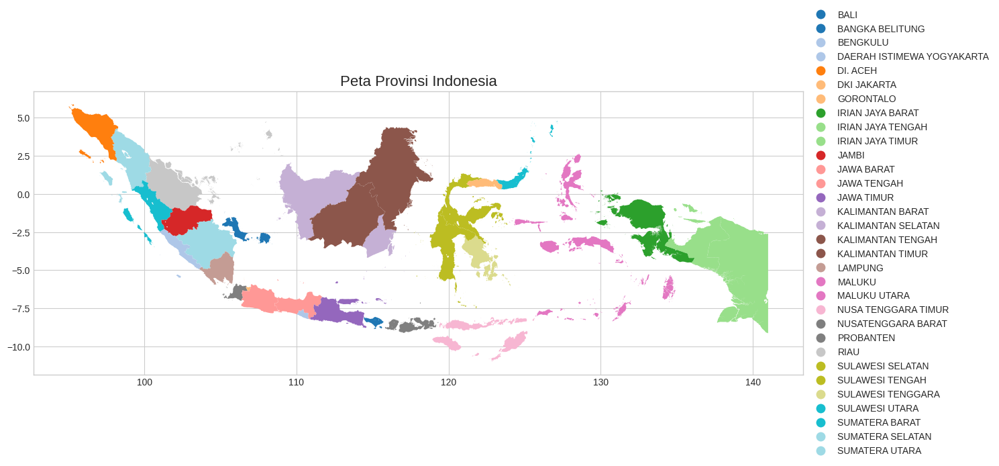

In [ ]:

fig, ax = plt.subplots(1, 1, figsize=(15, 10))
provinces.plot(column='Propinsi', cmap='tab20', legend=True,
               legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},
               ax=ax)
ax.set_title('Peta Provinsi Indonesia', fontsize=16)
plt.tight_layout()
plt.show()

## 3. Preprocessing Data

### 3.1 Konversi Data Gempa ke GeoDataFrame

In [ ]:

geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]
gdf_earthquakes = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")
gdf_earthquakes.head()

,id,time,place,magnitude,depth_km,longitude,latitude,geometry
0,us7000pvgi,2025-04-27 22:13:45,"54 km SSW of Modisi, Indonesia",4.5,89.601,124.2330,0.0015,POINT (124.233 0.0015)
1,us7000pyvc,2025-04-26 16:27:41,"224 km NW of Tobelo, Indonesia",4.5,50.398,126.7872,3.3479,POINT (126.7872 3.3479)
2,us7000pv70,2025-04-26 06:33:17,"110 km S of Abepura, Indonesia",4.9,35.000,140.5176,-3.5924,POINT (140.5176 -3.5924)
3,us7000pv4p,2025-04-25 21:19:50,"102 km W of Gorontalo, Indonesia",4.5,135.303,122.1611,0.3650,POINT (122.1611 0.365)
4,us7000pv1k,2025-04-25 15:59:44,"167 km NNW of Maubara, Timor Leste",4.5,503.140,124.7866,-7.1594,POINT (124.7866 -7.1594)


### 3.2 Spatial Join untuk Menentukan Provinsi dari Setiap Gempa

In [ ]:

if provinces.crs != gdf_earthquakes.crs:
    provinces = provinces.to_crs(gdf_earthquakes.crs)

# Lakukan spatial join untuk menentukan provinsi dari setiap gempa
gdf_earthquakes_with_province = gpd.sjoin(gdf_earthquakes, provinces, how="left", predicate="within")

print(f"Jumlah gempa sebelum spatial join: {len(gdf_earthquakes)}")
print(f"Jumlah gempa setelah spatial join: {len(gdf_earthquakes_with_province)}")
print(f"Jumlah gempa dengan provinsi teridentifikasi: {gdf_earthquakes_with_province['Propinsi'].notna().sum()}")
print(f"Jumlah gempa tanpa provinsi (di luar batas Indonesia): {gdf_earthquakes_with_province['Propinsi'].isna().sum()}")

Jumlah gempa sebelum spatial join: 4594
Jumlah gempa setelah spatial join: 4594
Jumlah gempa dengan provinsi teridentifikasi: 660
Jumlah gempa tanpa provinsi (di luar batas Indonesia): 3934


In [ ]:
# Tampilkan distribusi gempa per provinsi
province_counts = gdf_earthquakes_with_province['Propinsi'].value_counts()
print("Distribusi gempa per provinsi:")
province_counts

Distribusi gempa per provinsi:


,count
Propinsi,
IRIAN JAYA TIMUR,167
MALUKU,60
MALUKU UTARA,57
SUMATERA UTARA,35
SULAWESI TENGAH,34
IRIAN JAYA TENGAH,33
IRIAN JAYA BARAT,31
NUSA TENGGARA TIMUR,30
DI. ACEH,29


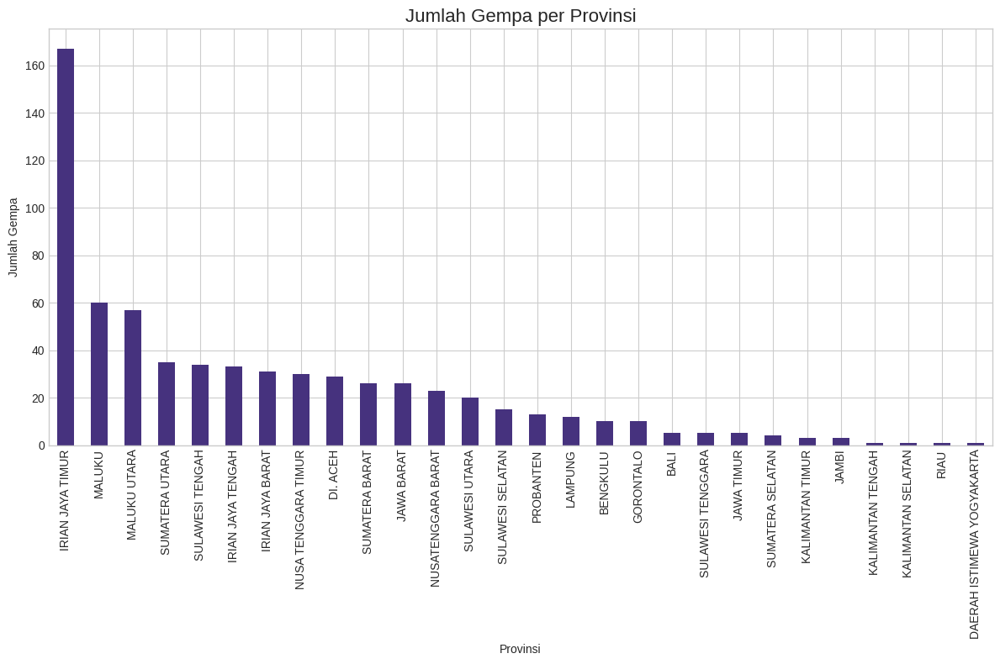

In [ ]:
# Visualisasi distribusi gempa per provinsi
plt.figure(figsize=(12, 8))
province_counts.plot(kind='bar')
plt.title('Jumlah Gempa per Provinsi', fontsize=16)
plt.xlabel('Provinsi')
plt.ylabel('Jumlah Gempa')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

### 3.3 Visualisasi Distribusi Spasial Gempa per Provinsi

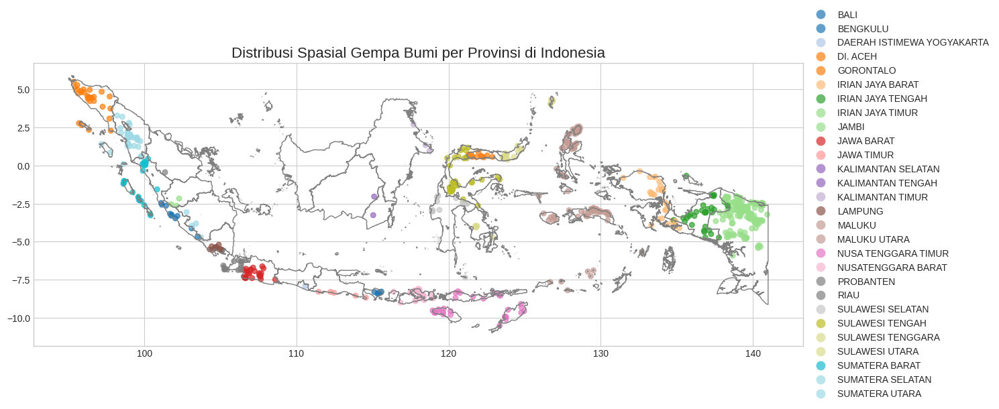

In [ ]:
# Visualisasi distribusi spasial gempa dengan warna berdasarkan provinsi
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plot batas provinsi
provinces.boundary.plot(ax=ax, linewidth=1, color='gray')

# Plot gempa dengan warna berdasarkan provinsi
gdf_earthquakes_with_province.plot(column='Propinsi', cmap='tab20',
                                   markersize=30, alpha=0.7,
                                   legend=True,
                                   legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5)},
                                   ax=ax)

ax.set_title('Distribusi Spasial Gempa Bumi per Provinsi di Indonesia', fontsize=16)
plt.tight_layout()
plt.show()

## 4. Clustering Spasial per Provinsi

### 4.1 Fungsi untuk Menentukan Parameter Optimal DBSCAN

In [ ]:
def find_optimal_dbscan_params(X, eps_values, min_samples_values):

    best_silhouette = -1
    best_params = {}
    results = []

    for eps in eps_values:
        for min_samples in min_samples_values:
            # Fit DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(X)

            # Hitung jumlah cluster (tidak termasuk noise dengan label -1)
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)

            # Hitung silhouette score jika ada lebih dari 1 cluster
            silhouette = -1
            if n_clusters > 1:
                # Filter out noise points for silhouette calculation
                mask = labels != -1
                if np.sum(mask) > 1:  # Ensure we have at least 2 points
                    silhouette = silhouette_score(X[mask], labels[mask])

            result = {
                'eps': eps,
                'min_samples': min_samples,
                'n_clusters': n_clusters,
                'n_noise': n_noise,
                'silhouette': silhouette
            }
            results.append(result)

            if silhouette > best_silhouette:
                best_silhouette = silhouette
                best_params = {'eps': eps, 'min_samples': min_samples}

    results_df = pd.DataFrame(results)
    return best_params, best_silhouette, results_df

### 4.2 Fungsi untuk Clustering DBSCAN dan OPTICS per Provinsi






In [ ]:
def kluster_provinsi(gdf, min_earthquakes=30):

    # Siapkan dictionary untuk menyimpan hasil
    results = {}

    # Daftar provinsi dengan jumlah gempa yang cukup
    provinces_to_analyze = gdf['Propinsi'].value_counts()
    provinces_to_analyze = provinces_to_analyze[provinces_to_analyze >= min_earthquakes].index.tolist()

    print(f"Melakukan clustering untuk {len(provinces_to_analyze)} provinsi dengan minimal {min_earthquakes} gempa...")

    # Nilai eps dan min_samples yang akan dicoba untuk DBSCAN
    eps_values = [0.1, 0.2, 0.3, 0.5, 1.0]
    min_samples_values_dbscan = [3, 5, 10, 15] # Use a specific variable name for DBSCAN

    # Lakukan clustering untuk setiap provinsi
    for province in provinces_to_analyze:
        print(f"\nAnalisis clustering untuk provinsi: {province}")

        # Filter data untuk provinsi tertentu
        province_data = gdf[gdf['Propinsi'] == province].copy()

        # Ekstrak koordinat untuk clustering
        X = province_data[['longitude', 'latitude']].values
        n_samples = len(X) # Get the number of samples for the current province

        # Ensure there are enough samples for clustering
        if n_samples < 2:
            print(f"Provinsi {province} hanya memiliki {n_samples} gempa, terlalu sedikit untuk clustering. Melewati.")
            continue

        # Standardisasi fitur magnitude dan depth_km untuk analisis karakteristik
        scaler = StandardScaler()
        # Check if magnitude and depth_km columns exist and are not all NaN/None
        if 'magnitude' in province_data.columns and 'depth_km' in province_data.columns and not province_data[['magnitude', 'depth_km']].isnull().all().all():
             province_data[['magnitude_scaled', 'depth_km_scaled']] = scaler.fit_transform(province_data[['magnitude', 'depth_km']].dropna()) # Drop NaNs before scaling
        else:
             print(f"Warning: Magnitude or depth_km data missing or insufficient for scaling in {province}.")
             # Create dummy columns or handle as needed if scaling is critical
             province_data['magnitude_scaled'] = np.nan
             province_data['depth_km_scaled'] = np.nan


        # 1. DBSCAN Clustering
        # Adjust min_samples_values for DBSCAN based on province size
        current_min_samples_values_dbscan = [ms for ms in min_samples_values_dbscan if ms <= n_samples]
        # Ensure there's at least one valid min_samples value (at least 2 if n_samples >= 2)
        if not current_min_samples_values_dbscan and n_samples >= 2:
             current_min_samples_values_dbscan = [2] # Fallback to 2 if default values are too high

        print("Mencari parameter optimal untuk DBSCAN...")
        # Pass the adjusted min_samples_values
        best_params, best_silhouette, results_df = find_optimal_dbscan_params(X, eps_values, current_min_samples_values_dbscan)

        dbscan_labels = np.full(n_samples, -2) # Initialize with a different label
        n_clusters_dbscan = 0
        n_noise_dbscan = n_samples

        if best_silhouette > -1 and best_params: # Check if optimal parameters were found
            print(f"Parameter optimal DBSCAN: eps={best_params['eps']}, min_samples={best_params['min_samples']}")
            print(f"Silhouette score: {best_silhouette:.4f}")

            # Fit DBSCAN with parameter optimal
            dbscan = DBSCAN(eps=best_params['eps'], min_samples=best_params['min_samples'])
            dbscan_labels = dbscan.fit_predict(X)
            province_data['dbscan_cluster'] = dbscan_labels

            # Hitung statistik cluster
            n_clusters_dbscan = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
            n_noise_dbscan = list(dbscan_labels).count(-1)
            print(f"Jumlah cluster DBSCAN: {n_clusters_dbscan}")
            print(f"Jumlah noise points: {n_noise_dbscan} ({n_noise_dbscan/n_samples*100:.2f}%)")
        else:
            print("Tidak dapat menemukan parameter optimal untuk DBSCAN.")
            province_data['dbscan_cluster'] = -2 # Label for no clustering performed


        # 2. OPTICS Clustering
        print("\nMelakukan clustering dengan OPTICS...")
        # Adjust min_samples for OPTICS based on province size
        # Ensure min_samples is at least 2 if n_samples >= 2
        min_samples_optics = max(2, min(5, n_samples)) # min_samples must be <= n_samples and >= 2

        # Adjust min_cluster_size based on province size if needed, or keep as fraction
        min_cluster_size_optics = max(2, int(n_samples * 0.05)) # Ensure min_cluster_size is at least 2


        if n_samples >= 2: # OPTICS requires at least 2 samples
            try:
                optics = OPTICS(min_samples=min_samples_optics, xi=0.05, min_cluster_size=min_cluster_size_optics)
                optics_labels = optics.fit_predict(X)
                province_data['optics_cluster'] = optics_labels

                # Hitung statistik cluster OPTICS
                n_clusters_optics = len(set(optics_labels)) - (1 if -1 in optics_labels else 0)
                n_noise_optics = list(optics_labels).count(-1)
                print(f"Jumlah cluster OPTICS: {n_clusters_optics}")
                print(f"Jumlah noise points OPTICS: {n_noise_optics} ({n_noise_optics/n_samples*100:.2f}%)")

                # Hitung silhouette score untuk OPTICS jika ada lebih dari 1 cluster
                optics_silhouette = -1
                if n_clusters_optics > 1:
                    mask = optics_labels != -1
                    if np.sum(mask) > 1:  # Ensure we have at least 2 points
                        optics_silhouette = silhouette_score(X[mask], optics_labels[mask])
                        print(f"Silhouette score OPTICS: {optics_silhouette:.4f}")
                else:
                     optics_silhouette = -1

            except ValueError as e:
                 print(f"Could not perform OPTICS clustering for {province}: {e}")
                 optics_labels = np.full(n_samples, -2) # Label for clustering failure
                 n_clusters_optics = 0
                 n_noise_optics = n_samples
                 optics_silhouette = -1

            province_data['optics_cluster'] = optics_labels

        else:
            print(f"Provinsi {province} hanya memiliki {n_samples} gempa, terlalu sedikit untuk OPTICS clustering.")
            province_data['optics_cluster'] = -2 # Label for no clustering performed
            n_clusters_optics = 0
            n_noise_optics = n_samples
            optics_silhouette = -1

        # Simpan hasil
        results[province] = {
            'data': province_data,
            'dbscan': {
                'params': best_params if 'best_params' in locals() else {}, # Handle case where optimal params not found
                'silhouette': best_silhouette,
                'n_clusters': n_clusters_dbscan,
                'n_noise': n_noise_dbscan,
                'results_df': results_df if 'results_df' in locals() else pd.DataFrame() # Handle case where results_df not created
            },
            'optics': {
                'params': {'min_samples': min_samples_optics if 'min_samples_optics' in locals() else 'N/A', # Handle case where optics clustering skipped
                           'xi': 0.05,
                           'min_cluster_size': min_cluster_size_optics if 'min_cluster_size_optics' in locals() else 'N/A'},
                'silhouette': optics_silhouette,
                'n_clusters': n_clusters_optics,
                'n_noise': n_noise_optics
            }
        }

    return results

In [ ]:
hasil= kluster_provinsi(gdf_earthquakes_with_province, min_earthquakes=1)

Melakukan clustering untuk 28 provinsi dengan minimal 1 gempa...

Analisis clustering untuk provinsi: IRIAN JAYA TIMUR
Mencari parameter optimal untuk DBSCAN...
Parameter optimal DBSCAN: eps=0.2, min_samples=15
Silhouette score: 0.8510
Jumlah cluster DBSCAN: 2
Jumlah noise points: 122 (73.05%)

Melakukan clustering dengan OPTICS...
Jumlah cluster OPTICS: 8
Jumlah noise points OPTICS: 65 (38.92%)
Silhouette score OPTICS: 0.7180

Analisis clustering untuk provinsi: MALUKU
Mencari parameter optimal untuk DBSCAN...
Parameter optimal DBSCAN: eps=0.3, min_samples=3
Silhouette score: 0.8285
Jumlah cluster DBSCAN: 2
Jumlah noise points: 11 (18.33%)

Melakukan clustering dengan OPTICS...
Jumlah cluster OPTICS: 5
Jumlah noise points OPTICS: 27 (45.00%)
Silhouette score OPTICS: 0.7613

Analisis clustering untuk provinsi: MALUKU UTARA
Mencari parameter optimal untuk DBSCAN...
Parameter optimal DBSCAN: eps=0.1, min_samples=5
Silhouette score: 0.9077
Jumlah cluster DBSCAN: 2
Jumlah noise points: 38 

## 5. Visualisasi Hasil Clustering per Provinsi

In [ ]:
def visualize_hasil(province_name, province_results, provinces_gdf):

    # Ambil data provinsi
    province_data = province_results['data']
    province_boundary = provinces_gdf[provinces_gdf['Propinsi'] == province_name]

    # Buat figure dengan 2 subplot (DBSCAN dan OPTICS)
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    # Plot batas provinsi
    province_boundary.boundary.plot(ax=axes[0], linewidth=1, color='black')
    province_boundary.boundary.plot(ax=axes[1], linewidth=1, color='black')

    # 1. Plot hasil DBSCAN
    # Tentukan warna berdasarkan cluster
    unique_labels = sorted(set(province_data['dbscan_cluster']))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Noise points (black)
            col = [0, 0, 0, 1]

        class_mask = province_data['dbscan_cluster'] == k
        axes[0].scatter(province_data.loc[class_mask, 'longitude'],
                      province_data.loc[class_mask, 'latitude'],
                      c=[col], s=50, alpha=0.7, edgecolor='k', linewidth=0.3,
                      label=f'Cluster {k}' if k != -1 else 'Noise')

    # Tambahkan judul dan legenda
    dbscan_params = province_results['dbscan']['params']
    dbscan_silhouette = province_results['dbscan']['silhouette']
    axes[0].set_title(f'DBSCAN Clustering - {province_name}\n'
                    f'eps={dbscan_params.get("eps", "N/A")}, '
                    f'min_samples={dbscan_params.get("min_samples", "N/A")}, '
                    f'Silhouette={dbscan_silhouette:.4f}', fontsize=12)
    axes[0].legend(loc='upper right')

    # 2. Plot hasil OPTICS
    unique_labels = sorted(set(province_data['optics_cluster']))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))

    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Noise points (black)
            col = [0, 0, 0, 1]

        class_mask = province_data['optics_cluster'] == k
        axes[1].scatter(province_data.loc[class_mask, 'longitude'],
                      province_data.loc[class_mask, 'latitude'],
                      c=[col], s=50, alpha=0.7, edgecolor='k', linewidth=0.3,
                      label=f'Cluster {k}' if k != -1 else 'Noise')

    # Tambahkan judul dan legenda
    optics_params = province_results['optics']['params']
    optics_silhouette = province_results['optics']['silhouette']
    axes[1].set_title(f'OPTICS Clustering - {province_name}\n'
                     f'min_samples={optics_params.get("min_samples", "N/A")}, '
                     f'Silhouette={optics_silhouette:.4f}', fontsize=12)
    axes[1].legend(loc='upper right')

    plt.tight_layout()
    plt.show()


Visualisasi hasil clustering untuk provinsi: IRIAN JAYA TIMUR


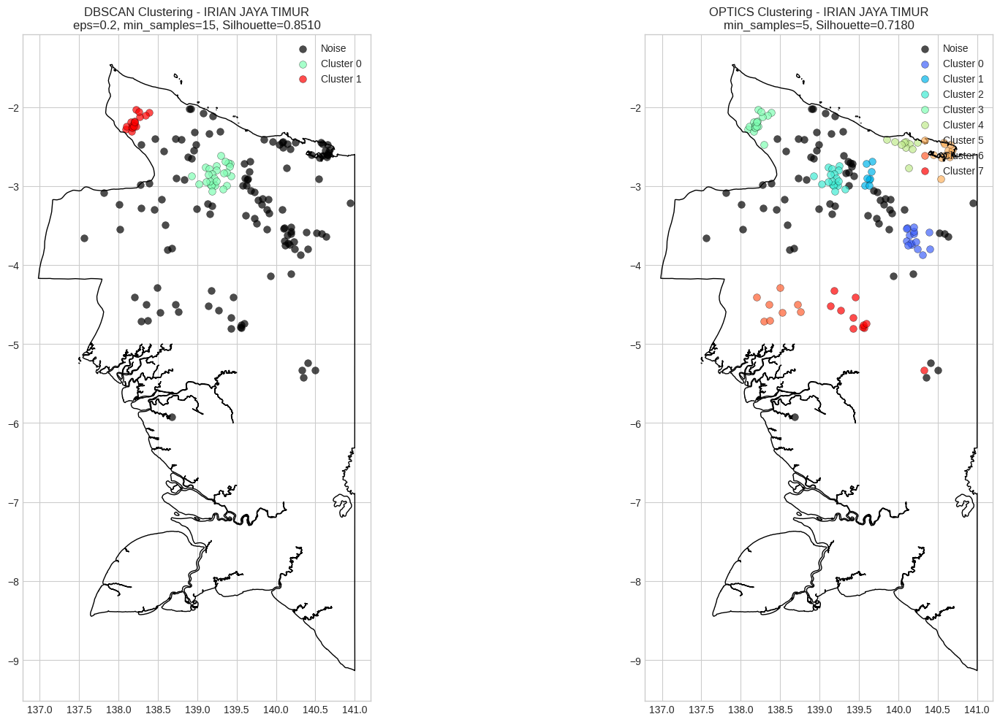


Visualisasi hasil clustering untuk provinsi: MALUKU


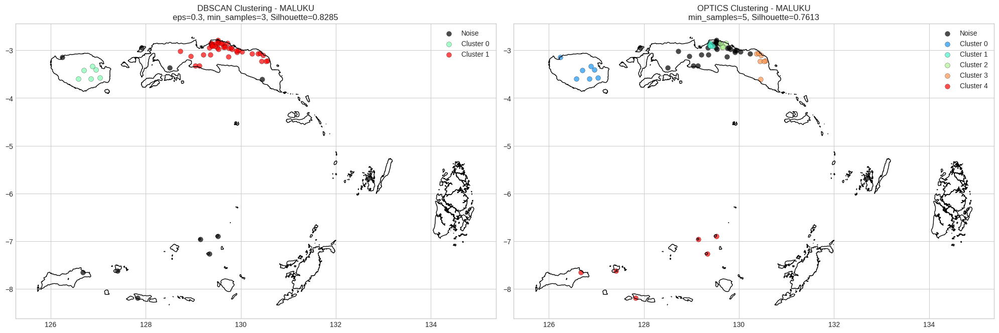


Visualisasi hasil clustering untuk provinsi: MALUKU UTARA


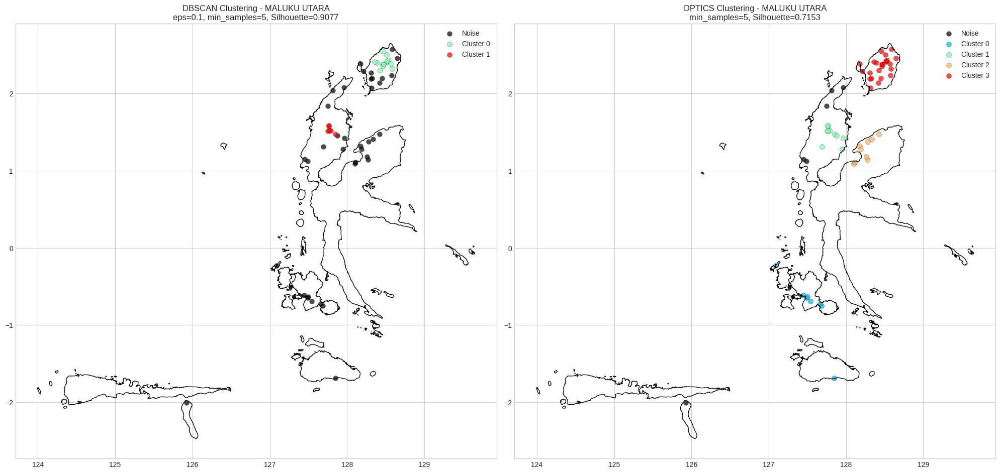


Visualisasi hasil clustering untuk provinsi: SUMATERA UTARA


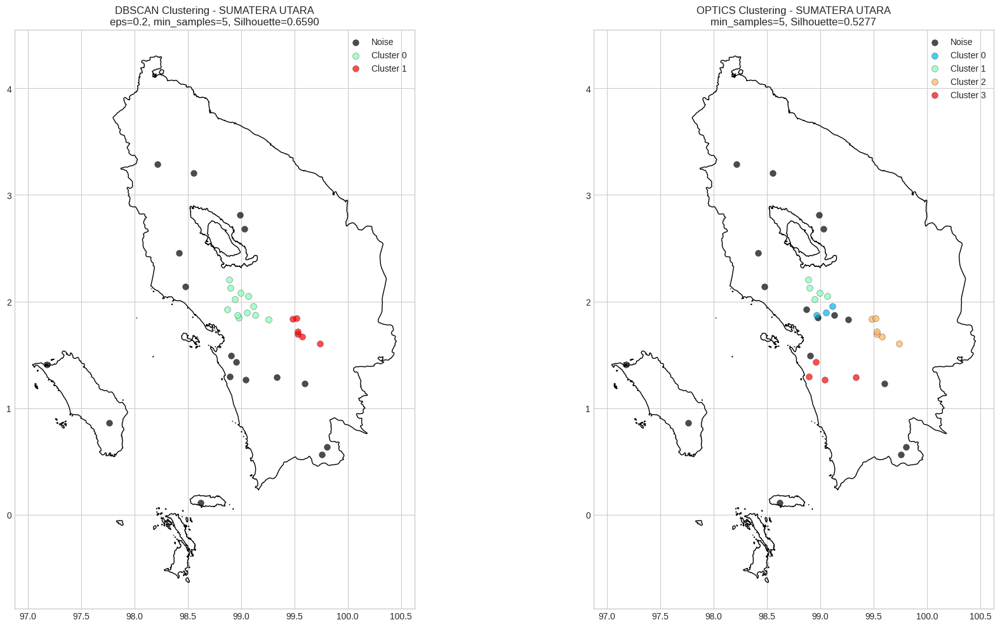


Visualisasi hasil clustering untuk provinsi: SULAWESI TENGAH


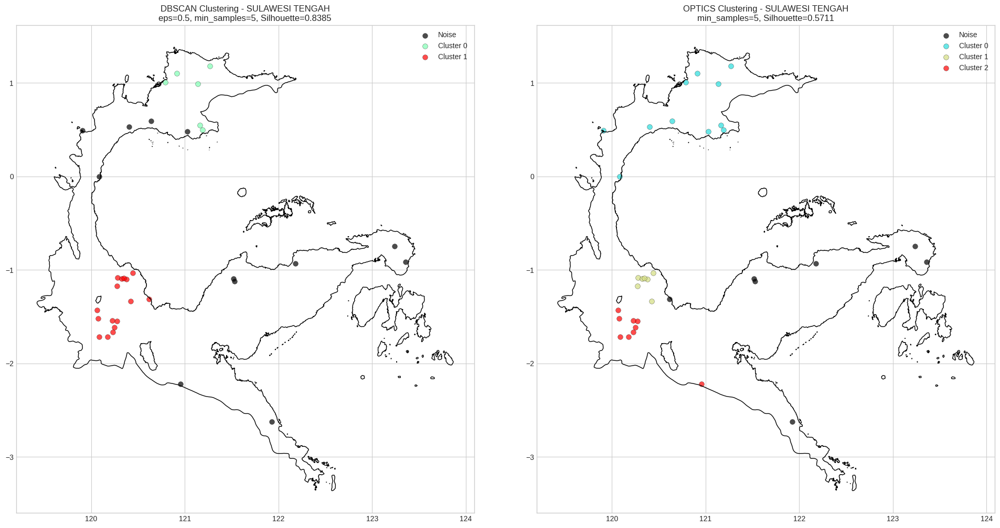


Visualisasi hasil clustering untuk provinsi: IRIAN JAYA TENGAH


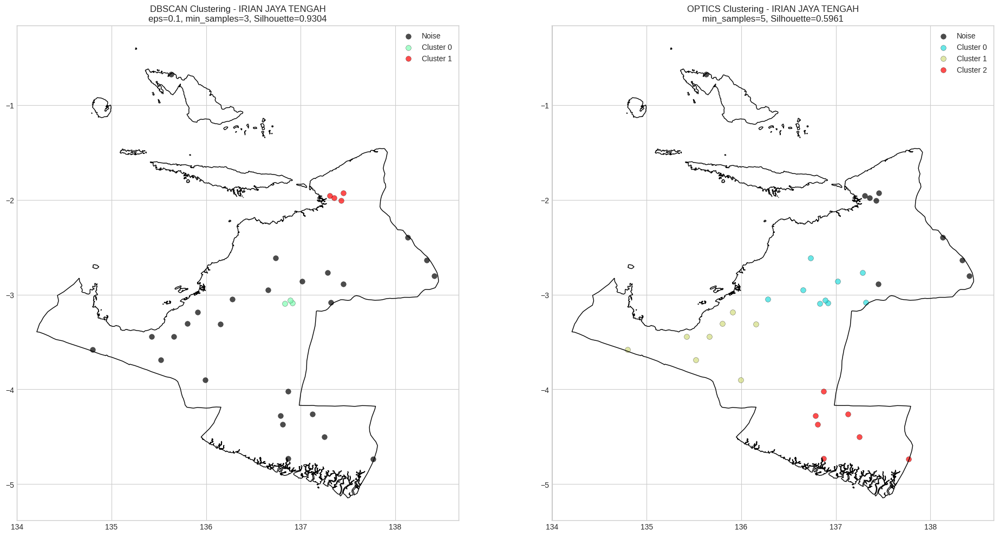


Visualisasi hasil clustering untuk provinsi: IRIAN JAYA BARAT


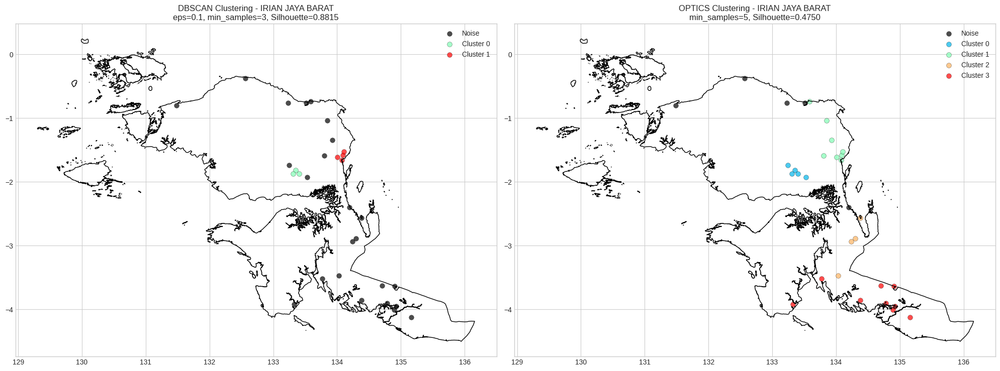


Visualisasi hasil clustering untuk provinsi: NUSA TENGGARA TIMUR


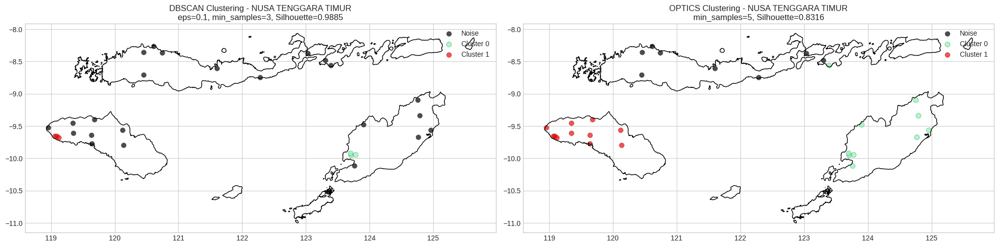


Visualisasi hasil clustering untuk provinsi: DI. ACEH


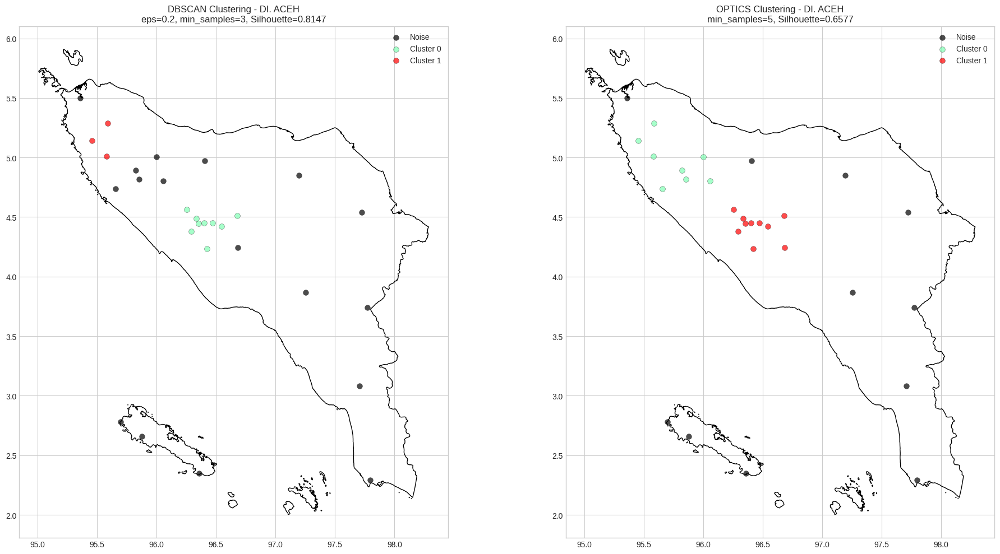


Visualisasi hasil clustering untuk provinsi: SUMATERA BARAT


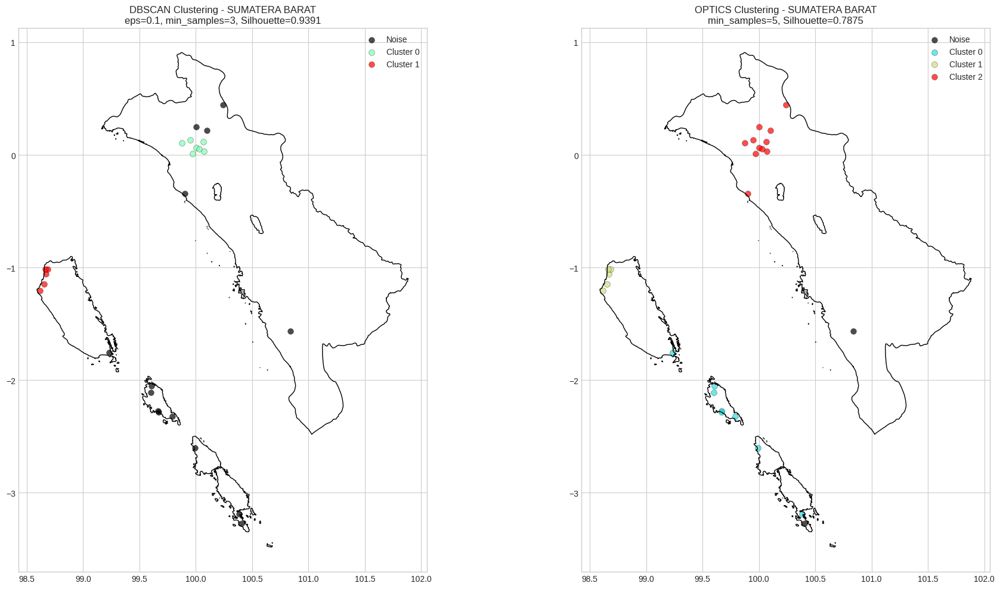


Visualisasi hasil clustering untuk provinsi: JAWA BARAT


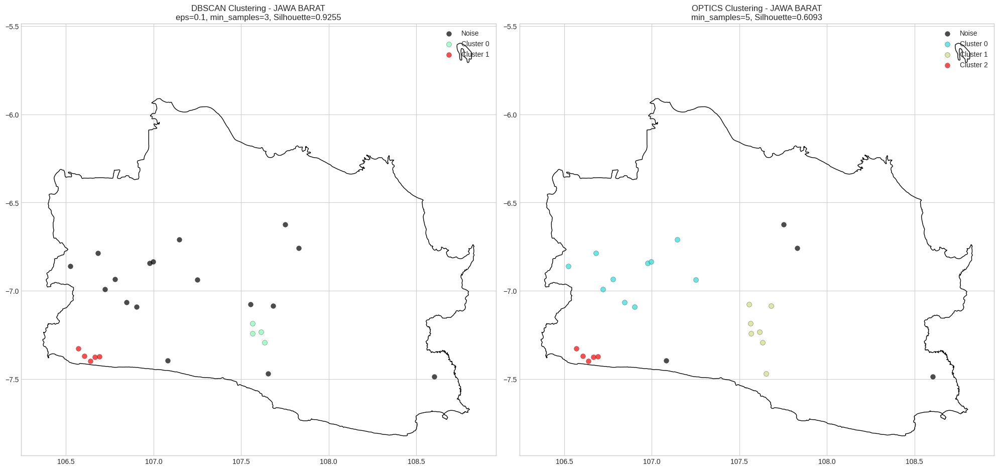


Visualisasi hasil clustering untuk provinsi: NUSATENGGARA BARAT


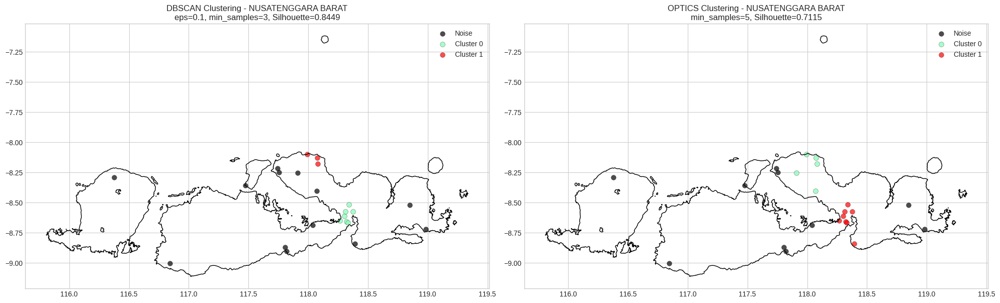


Visualisasi hasil clustering untuk provinsi: SULAWESI UTARA


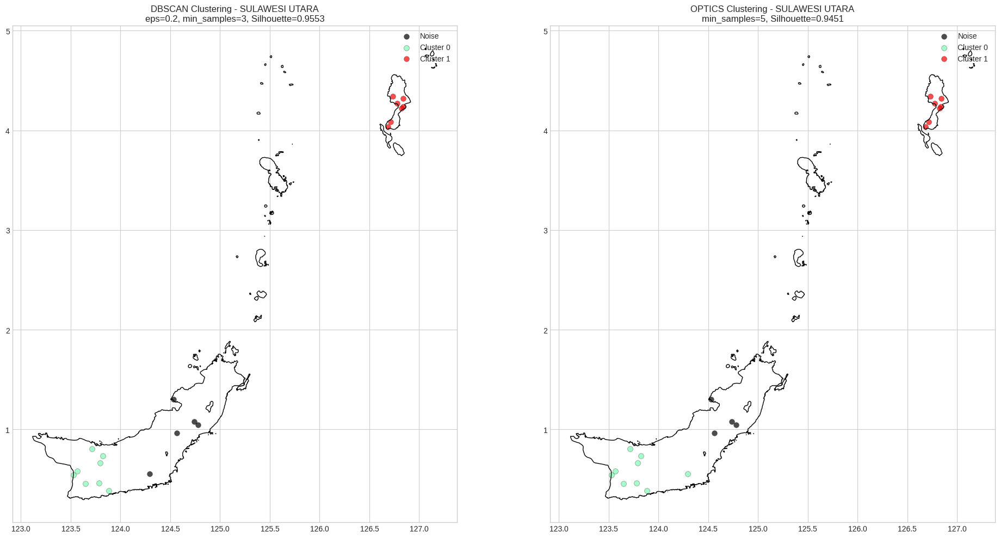


Visualisasi hasil clustering untuk provinsi: SULAWESI SELATAN


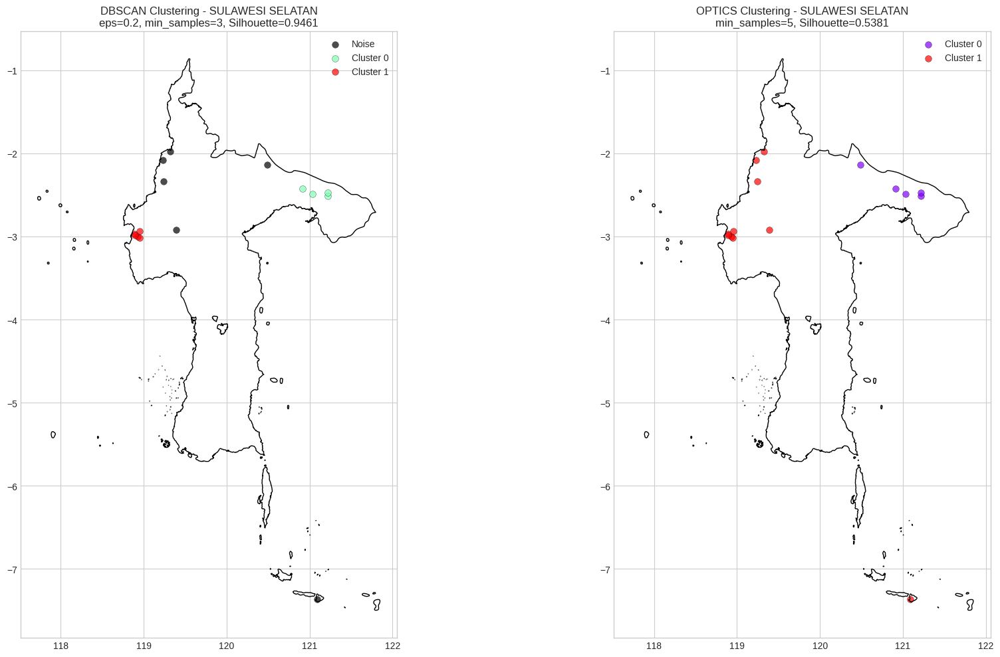


Visualisasi hasil clustering untuk provinsi: PROBANTEN


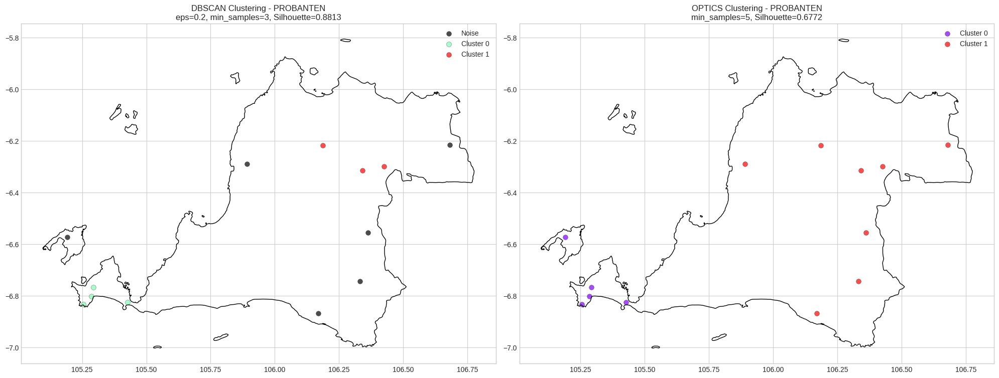


Visualisasi hasil clustering untuk provinsi: LAMPUNG


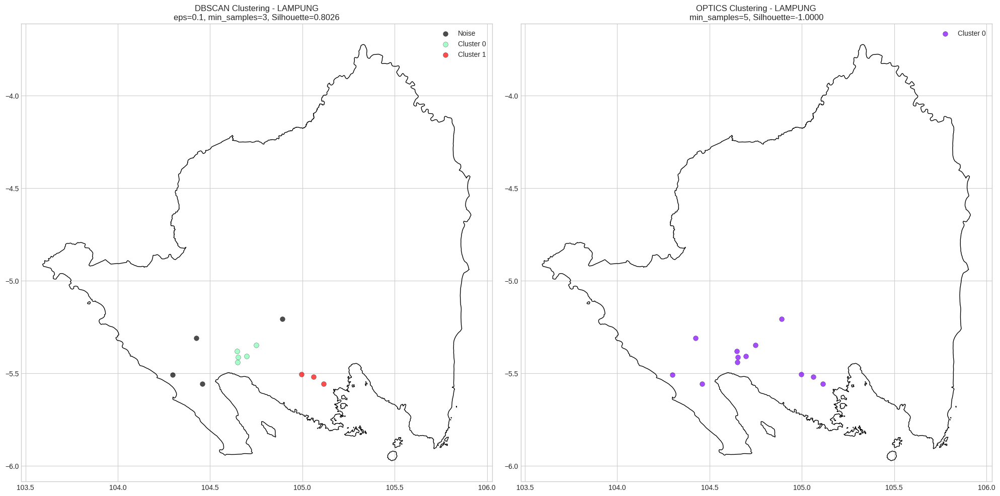


Visualisasi hasil clustering untuk provinsi: BENGKULU


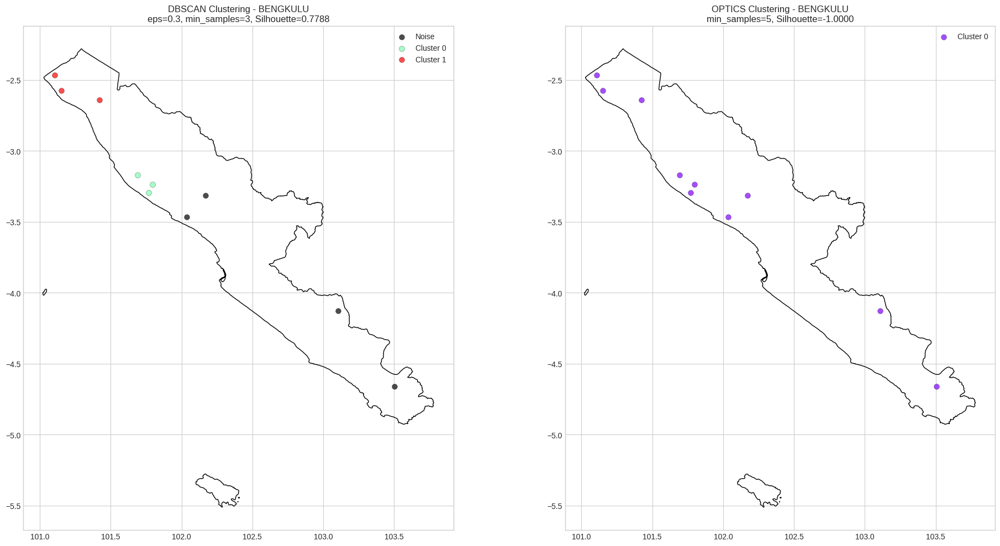


Visualisasi hasil clustering untuk provinsi: GORONTALO


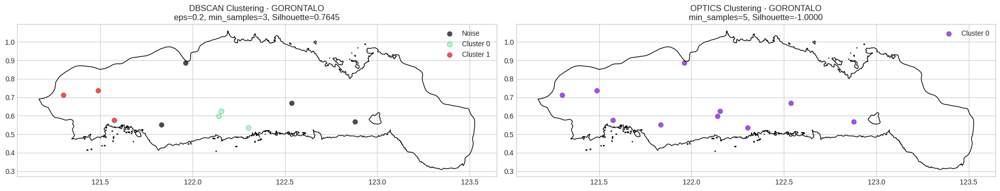


Visualisasi hasil clustering untuk provinsi: BALI


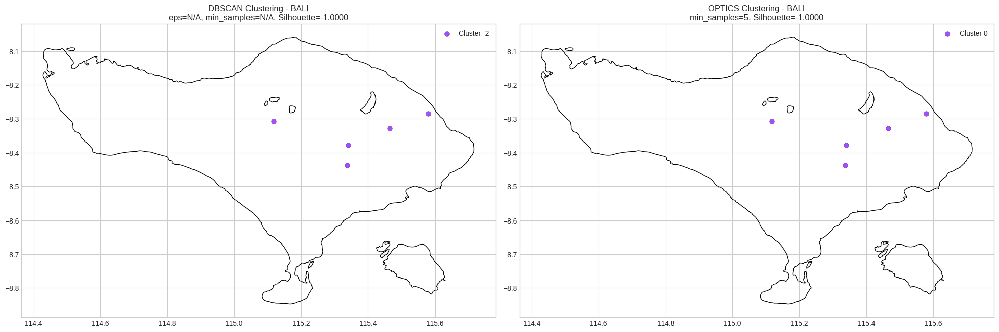


Visualisasi hasil clustering untuk provinsi: SULAWESI TENGGARA


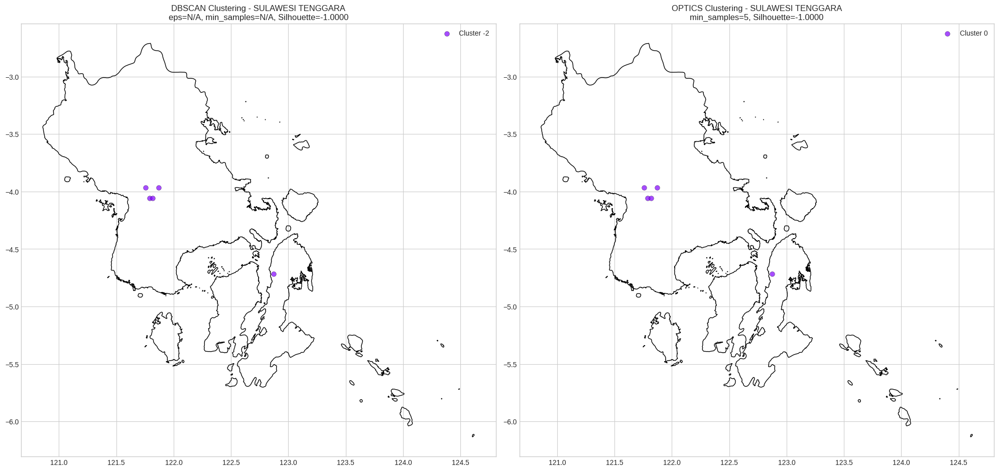


Visualisasi hasil clustering untuk provinsi: JAWA TIMUR


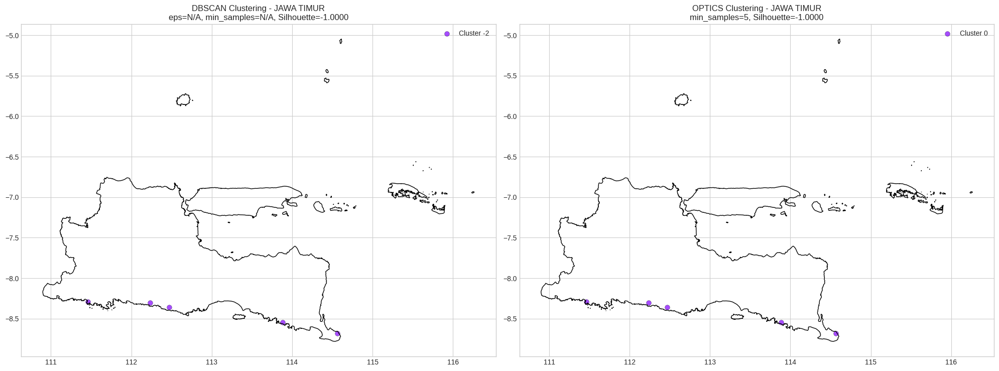


Visualisasi hasil clustering untuk provinsi: SUMATERA SELATAN


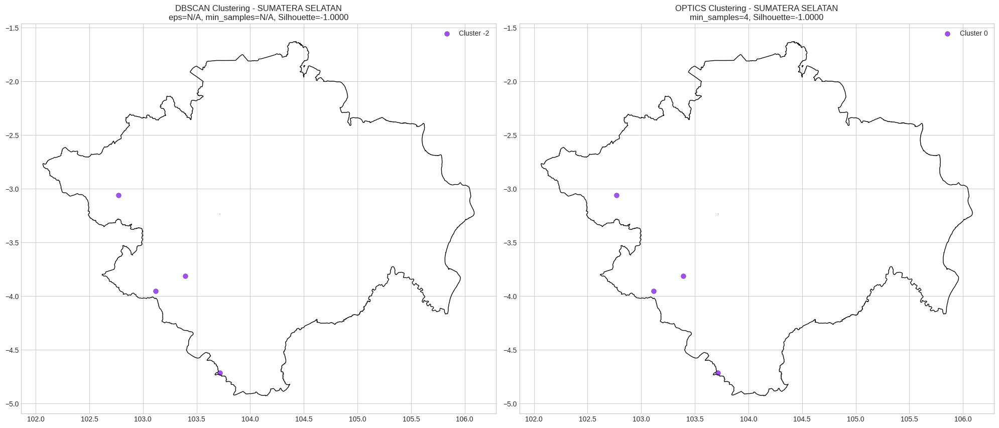


Visualisasi hasil clustering untuk provinsi: KALIMANTAN TIMUR


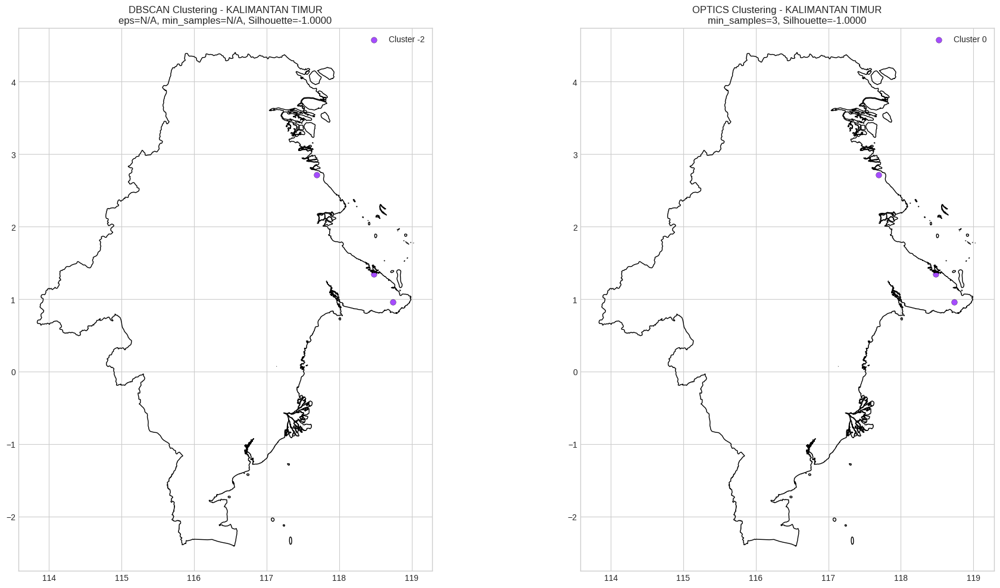


Visualisasi hasil clustering untuk provinsi: JAMBI


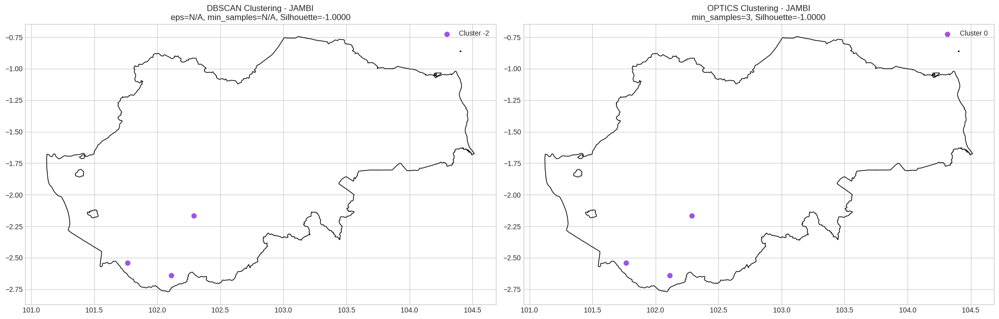

In [ ]:
# Visualisasi hasil clustering untuk setiap provinsi
for province_name, province_results in hasil.items():
    print(f"\nVisualisasi hasil clustering untuk provinsi: {province_name}")
    visualize_hasil(province_name, province_results, provinces)

## 6. Analisis Karakteristik Cluster per Provinsi

In [ ]:
def analyze_cluster_characteristics(province_name, province_results):
    """
    Analisis karakteristik cluster untuk satu provinsi

    Parameters:
    -----------
    province_name : str
        Nama provinsi
    province_results : dict
        Dictionary berisi hasil clustering untuk provinsi tersebut
    """
    # Ambil data provinsi
    province_data = province_results['data']

    # Jika provinsi memiliki terlalu sedikit gempa, tampilkan informasi sederhana
    if len(province_data) < 3:
        print(f"\n=== Analisis Karakteristik untuk Provinsi {province_name} ===\n")
        print(f"Provinsi {province_name} hanya memiliki {len(province_data)} gempa, tidak cukup untuk analisis cluster.")
        print("\nStatistik dasar:")
        print(province_data[['magnitude', 'depth_km']].describe())
        return

    print(f"\n=== Analisis Karakteristik Cluster untuk Provinsi {province_name} ===\n")

    # 1. Analisis DBSCAN
    print("1. Karakteristik Cluster DBSCAN:")
    dbscan_stats = province_data.groupby('dbscan_cluster').agg({
        'magnitude': ['mean', 'min', 'max', 'count'],
        'depth_km': ['mean', 'min', 'max']
    })
    print(dbscan_stats)

    # Visualisasi distribusi magnitude dan depth per cluster DBSCAN
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    sns.boxplot(x='dbscan_cluster', y='magnitude', data=province_data, ax=axes[0])
    axes[0].set_title(f'Distribusi Magnitude per Cluster DBSCAN - {province_name}')
    axes[0].set_xlabel('Cluster')
    axes[0].set_ylabel('Magnitude')

    sns.boxplot(x='dbscan_cluster', y='depth_km', data=province_data, ax=axes[1])
    axes[1].set_title(f'Distribusi Kedalaman per Cluster DBSCAN - {province_name}')
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel('Kedalaman (km)')

    plt.tight_layout()
    plt.show()

    # 2. Analisis OPTICS
    print("\n2. Karakteristik Cluster OPTICS:")
    optics_stats = province_data.groupby('optics_cluster').agg({
        'magnitude': ['mean', 'min', 'max', 'count'],
        'depth_km': ['mean', 'min', 'max']
    })
    print(optics_stats)

    # Visualisasi distribusi magnitude dan depth per cluster OPTICS
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    sns.boxplot(x='optics_cluster', y='magnitude', data=province_data, ax=axes[0])
    axes[0].set_title(f'Distribusi Magnitude per Cluster OPTICS - {province_name}')
    axes[0].set_xlabel('Cluster')
    axes[0].set_ylabel('Magnitude')

    sns.boxplot(x='optics_cluster', y='depth_km', data=province_data, ax=axes[1])
    axes[1].set_title(f'Distribusi Kedalaman per Cluster OPTICS - {province_name}')
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel('Kedalaman (km)')

    plt.tight_layout()
    plt.show()

    # 3. Analisis korelasi antara magnitude dan depth
    print("\n3. Korelasi antara Magnitude dan Kedalaman:")
    correlation = province_data[['magnitude', 'depth_km']].corr().iloc[0, 1]
    print(f"Korelasi Pearson: {correlation:.4f}")

    # Visualisasi scatter plot magnitude vs depth dengan warna berdasarkan cluster
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # DBSCAN
    scatter = axes[0].scatter(province_data['depth_km'], province_data['magnitude'],
                            c=province_data['dbscan_cluster'], cmap='viridis',
                            s=50, alpha=0.7, edgecolor='k')
    axes[0].set_title(f'Magnitude vs Kedalaman (DBSCAN) - {province_name}')
    axes[0].set_xlabel('Kedalaman (km)')
    axes[0].set_ylabel('Magnitude')
    legend1 = axes[0].legend(*scatter.legend_elements(), title="Cluster")
    axes[0].add_artist(legend1)

    # OPTICS
    scatter = axes[1].scatter(province_data['depth_km'], province_data['magnitude'],
                            c=province_data['optics_cluster'], cmap='viridis',
                            s=50, alpha=0.7, edgecolor='k')
    axes[1].set_title(f'Magnitude vs Kedalaman (OPTICS) - {province_name}')
    axes[1].set_xlabel('Kedalaman (km)')
    axes[1].set_ylabel('Magnitude')
    legend2 = axes[1].legend(*scatter.legend_elements(), title="Cluster")
    axes[1].add_artist(legend2)

    plt.tight_layout()
    plt.show()


=== Analisis Karakteristik Cluster untuk Provinsi IRIAN JAYA TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.782787  4.5  5.6   122  39.717754   5.238  150.65
 0              4.911111  4.5  6.3    27  40.486333  23.750  110.51
 1              4.950000  4.5  6.2    18  21.161222  10.000   39.31


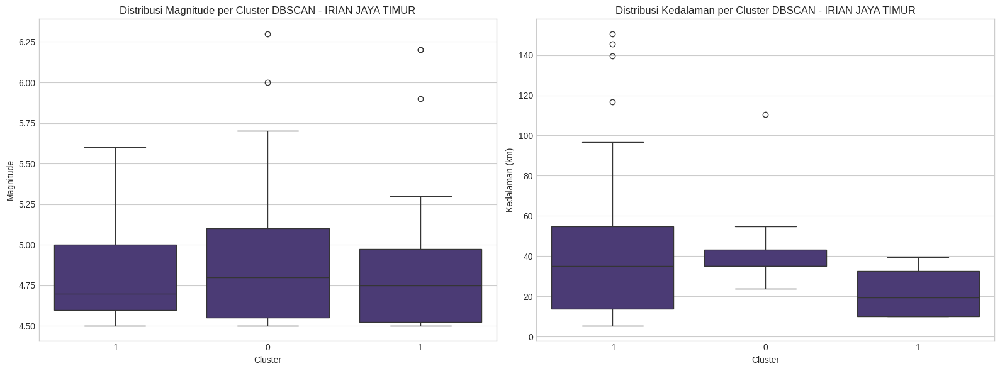


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
-1              4.813846  4.5  6.3    65  46.443246  10.000  110.510
 0              4.880000  4.5  5.6    15  35.292533  10.000   96.620
 1              4.687500  4.5  5.1     8  46.194875  10.000  116.700
 2              4.883333  4.5  5.7    18  39.040111  23.750   54.934
 3              4.947368  4.5  6.2    19  21.992789  10.000   39.310
 4              4.840000  4.5  5.5    10  23.737900   5.238   35.000
 5              4.676923  4.5  5.0    13  25.531077  10.000   37.080
 6              4.825000  4.5  5.5     8  65.555000  10.000  150.650
 7              4.718182  4.5  5.2    11  17.048455  10.000   59.152


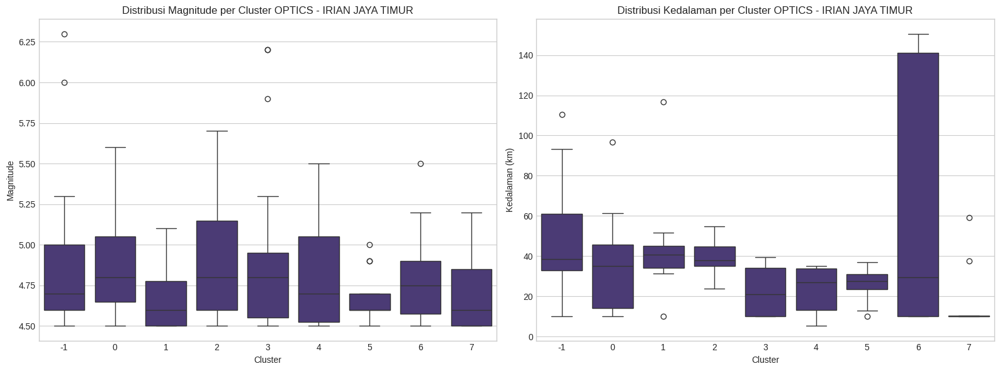


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0662


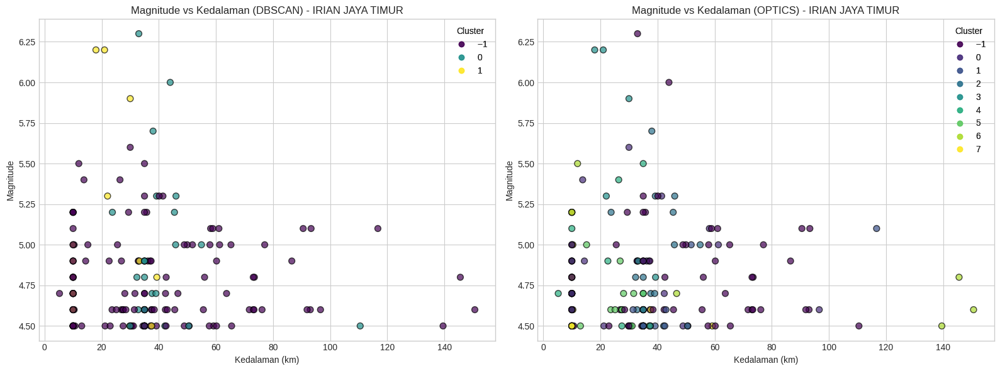


=== Analisis Karakteristik Cluster untuk Provinsi MALUKU ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean    min      max
dbscan_cluster                                                     
-1              4.590909  4.5  4.8    11  91.798182  10.00  189.836
 0              4.600000  4.5  4.8     6  10.037833  10.00   10.225
 1              4.718605  4.5  5.7    43  12.915535   9.32   67.967


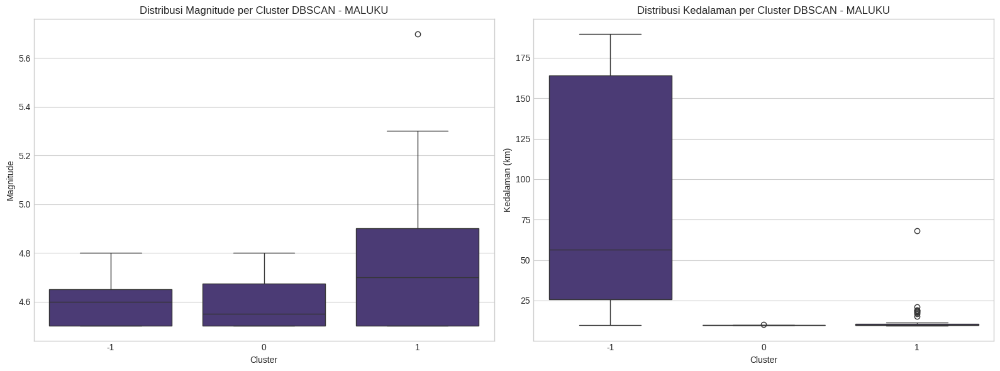


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              4.711111  4.5  5.7    27   16.479926   9.320   67.967
 0              4.585714  4.5  4.8     7   10.150429  10.000   10.826
 1              4.737500  4.5  5.0     8   10.823375  10.000   15.272
 2              4.660000  4.5  4.9     5   10.265400  10.000   11.327
 3              4.685714  4.5  5.0     7   11.099857  10.000   17.699
 4              4.616667  4.5  4.8     6  148.958500  56.552  189.836


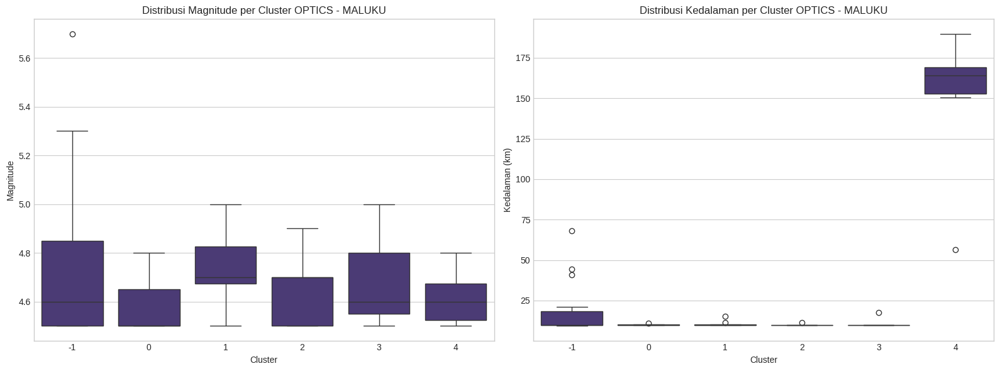


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0629


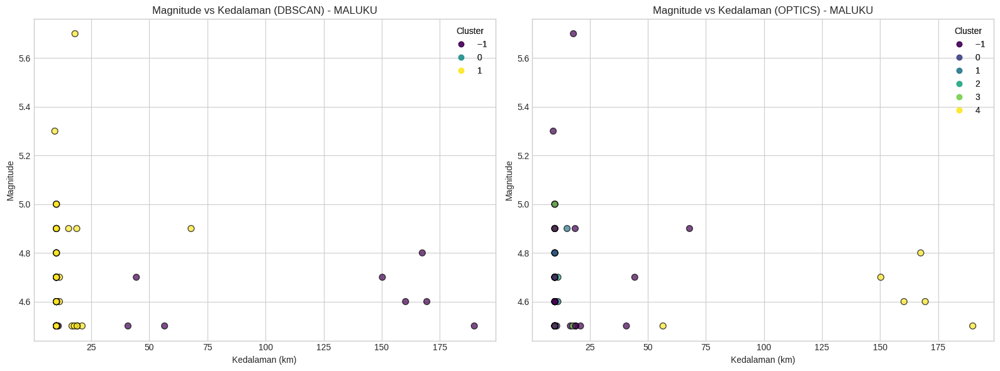


=== Analisis Karakteristik Cluster untuk Provinsi MALUKU UTARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.755263  4.5  6.0    38   75.253579   8.318  233.222
 0              4.646154  4.5  5.1    13  131.867692  35.000  238.100
 1              4.900000  4.5  5.4     6    9.190500   7.722   10.000


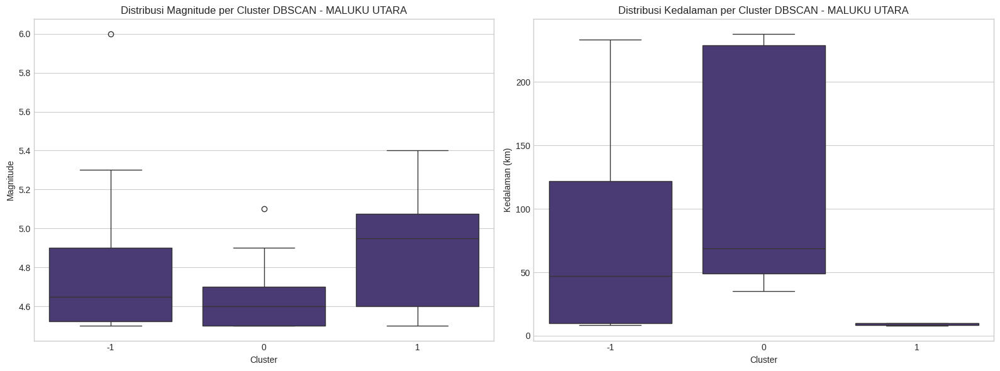


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              5.050000  4.7  6.0     6  102.070167  10.000  233.222
 0              4.650000  4.5  5.0     8   20.243250  10.000   38.646
 1              4.900000  4.5  5.4    10   33.820300   7.722  135.110
 2              4.633333  4.5  5.1     9   36.537222   8.318  102.854
 3              4.679167  4.5  5.1    24  132.818917  35.000  238.100


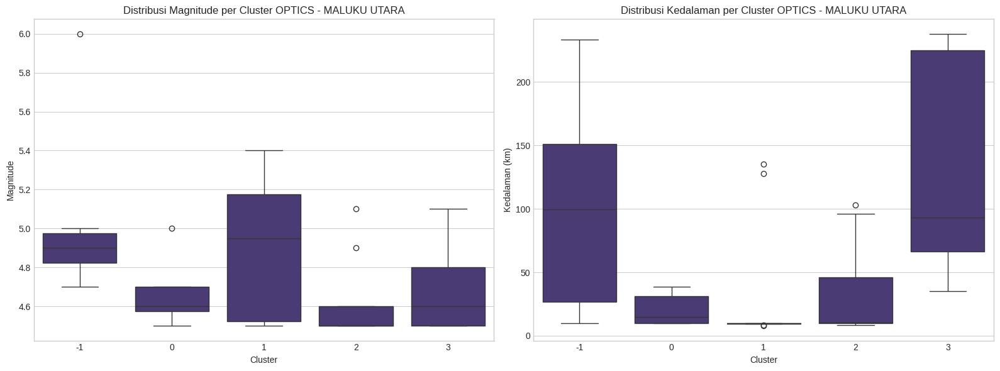


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1826


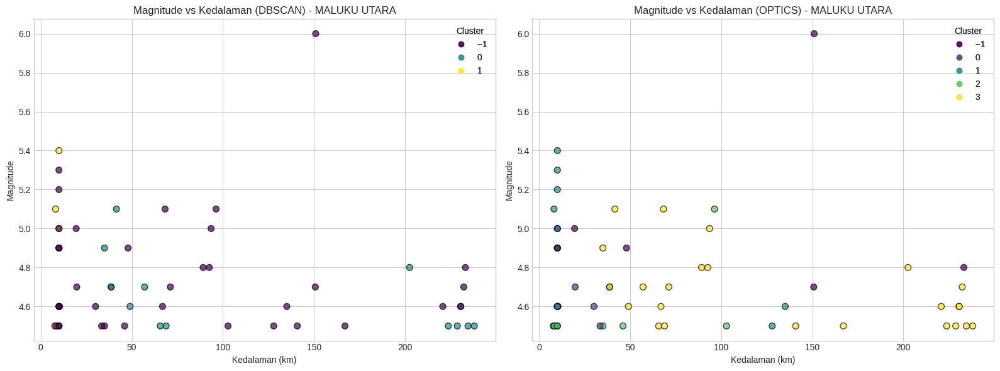


=== Analisis Karakteristik Cluster untuk Provinsi SUMATERA UTARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
dbscan_cluster                                                        
-1              4.764706  4.5  5.2    17   89.300588   10.000  164.650
 0              4.925000  4.6  5.9    12   57.954667    3.604  140.880
 1              4.700000  4.5  5.2     6  173.258500  157.081  182.797


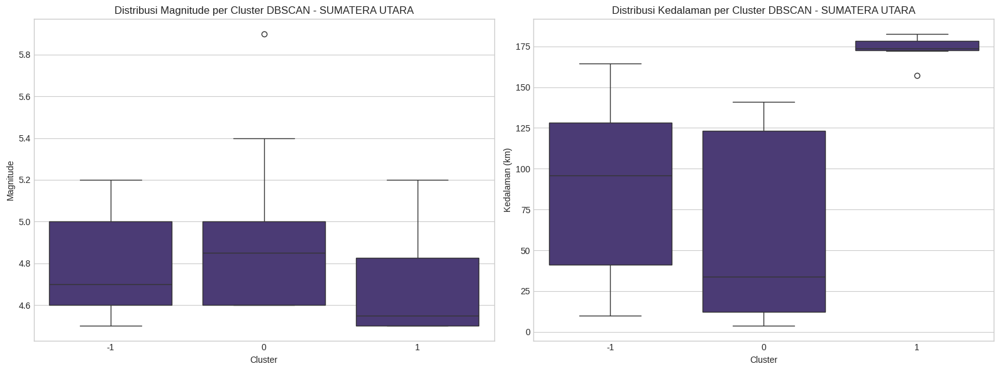


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                  
                    mean  min  max count        mean      min      max
optics_cluster                                                        
-1              4.788235  4.5  5.4    17   84.388000    3.604  164.650
 0              4.833333  4.7  5.0     3  130.128333  121.898  140.880
 1              5.020000  4.6  5.9     5   14.443600   10.000   20.955
 2              4.700000  4.5  5.2     6  173.258500  157.081  182.797
 3              4.775000  4.5  5.1     4   79.091750   10.000  117.197


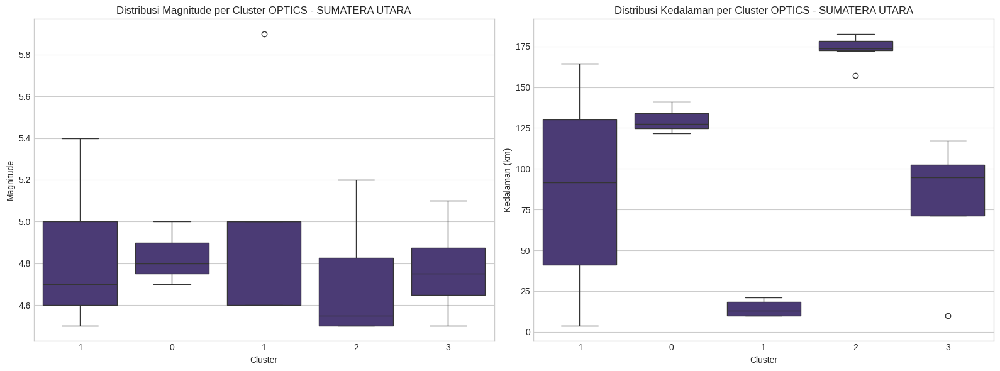


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.2849


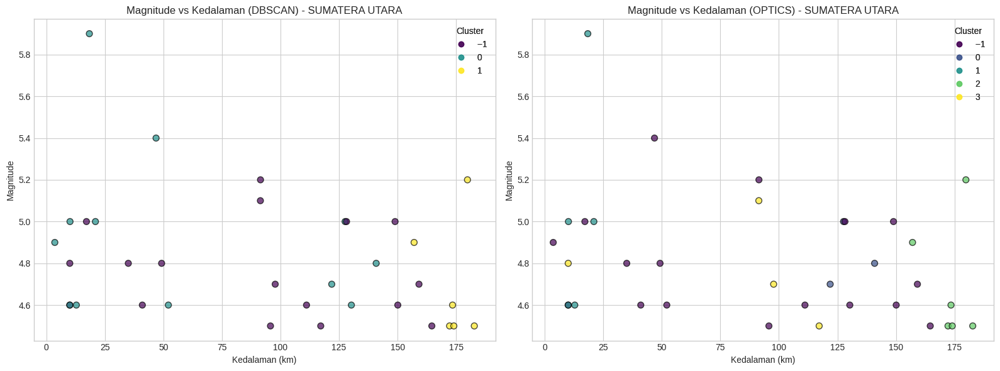


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI TENGAH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.708333  4.5  5.2    12   38.405917  10.000  100.759
 0              4.816667  4.5  5.4     6  241.555500  57.398  576.502
 1              4.868750  4.5  5.9    16   18.281375   9.220   49.159


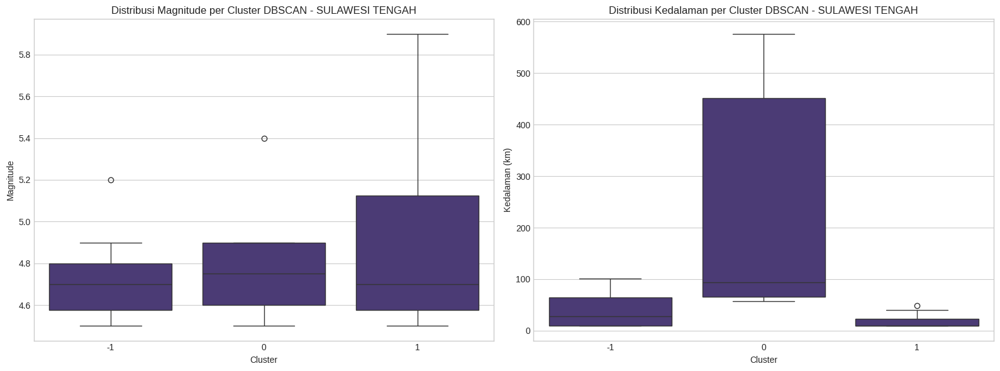


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                
                    mean  min  max count        mean    min      max
optics_cluster                                                      
-1              4.728571  4.5  5.1     7   19.922429  10.00   43.670
 0              4.809091  4.5  5.4    11  160.977000  10.00  576.502
 1              4.857143  4.5  5.3     7   19.377143  10.00   49.159
 2              4.811111  4.5  5.9     9   17.429111   9.22   39.789


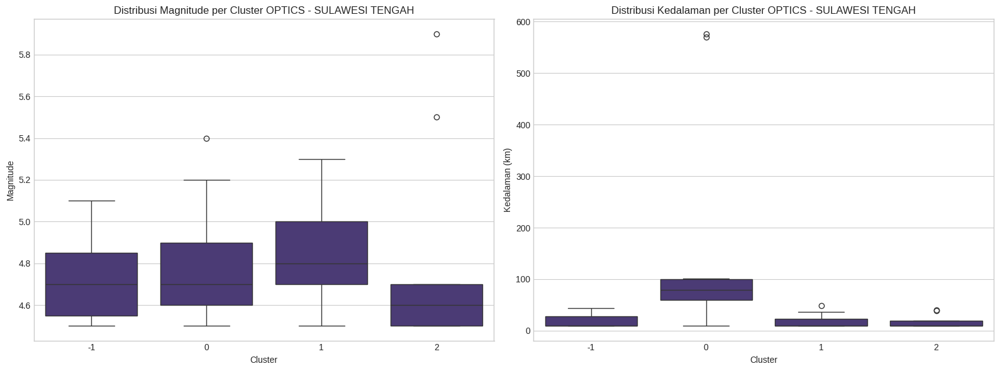


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0213


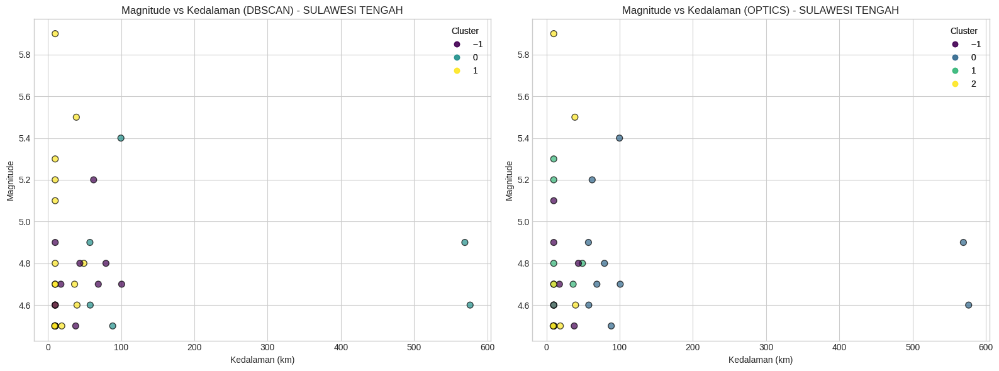


=== Analisis Karakteristik Cluster untuk Provinsi IRIAN JAYA TENGAH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km               
                    mean  min  max count       mean   min      max
dbscan_cluster                                                    
-1              4.680769  4.5  5.2    26  32.151654  10.0  147.292
 0              5.166667  4.5  5.9     3  41.670333  31.0   51.014
 1              4.750000  4.6  5.1     4  22.713750  10.0   35.541


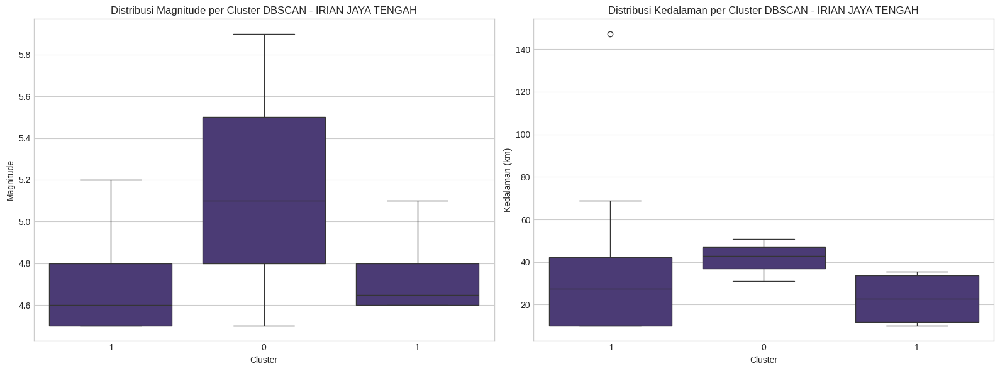


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km               
                    mean  min  max count       mean   min      max
optics_cluster                                                    
-1              4.722222  4.5  5.1     9  26.640556  10.0   54.082
 0              4.911111  4.5  5.9     9  44.671444  31.0   68.897
 1              4.662500  4.5  4.9     8  18.562500  10.0   37.520
 2              4.600000  4.5  4.9     7  37.357286  10.0  147.292


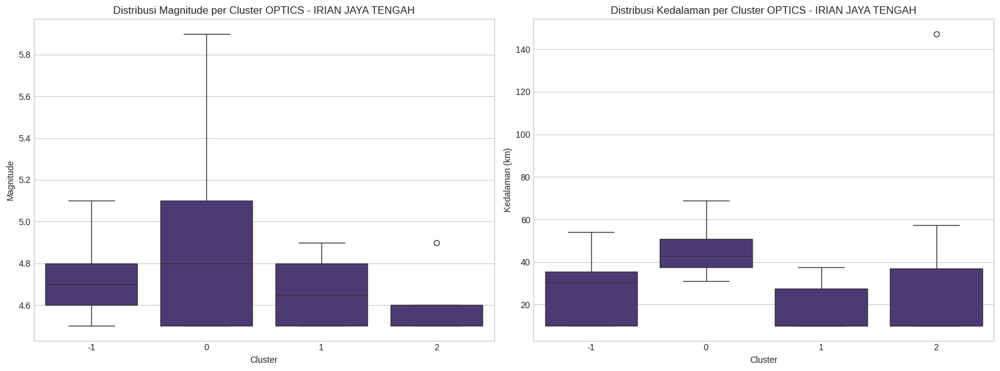


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0295


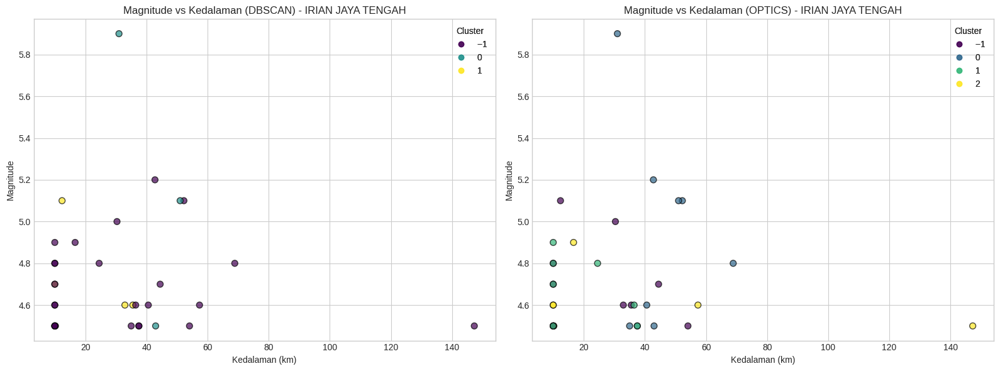


=== Analisis Karakteristik Cluster untuk Provinsi IRIAN JAYA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.704167  4.5  5.2    24  23.222417   9.754  56.960
 0              4.733333  4.6  5.0     3  22.270000  10.000  30.830
 1              4.775000  4.5  5.1     4  44.899250  35.740  61.167


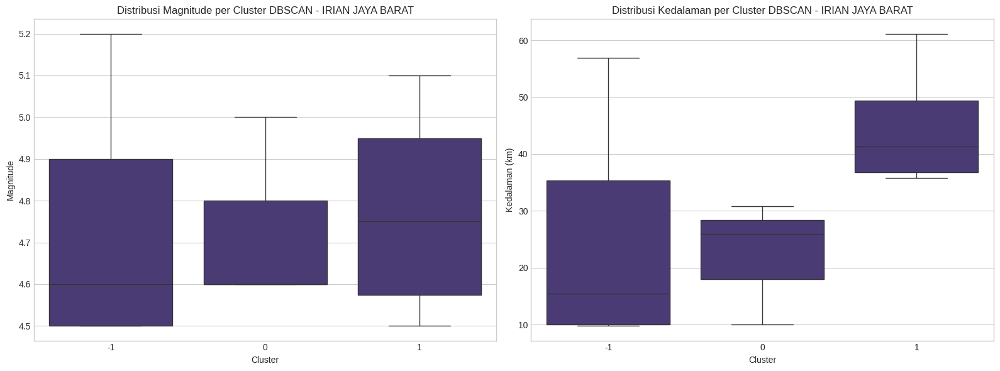


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
optics_cluster                                                     
-1              4.840000  4.6  5.2     5  39.040000  33.600  46.990
 0              4.880000  4.6  5.1     5  23.866600  10.000  42.523
 1              4.637500  4.5  5.1     8  42.207250  28.140  61.167
 2              4.625000  4.5  4.8     4  12.804500   9.754  16.440
 3              4.666667  4.5  5.0     9  11.148444  10.000  16.340


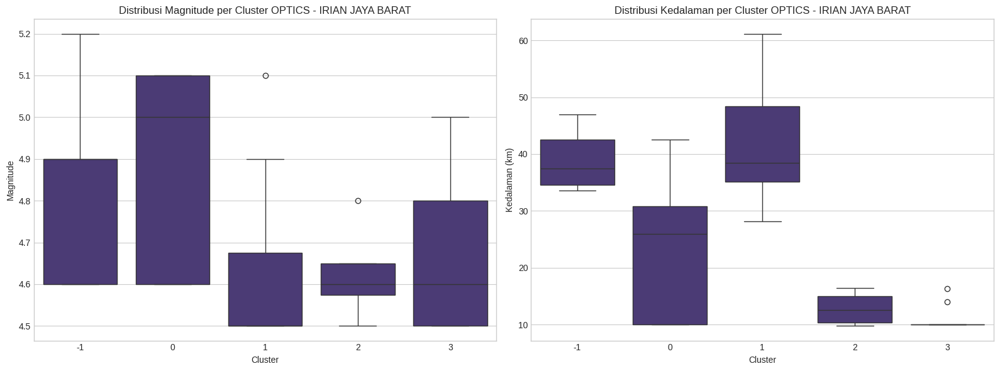


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.1798


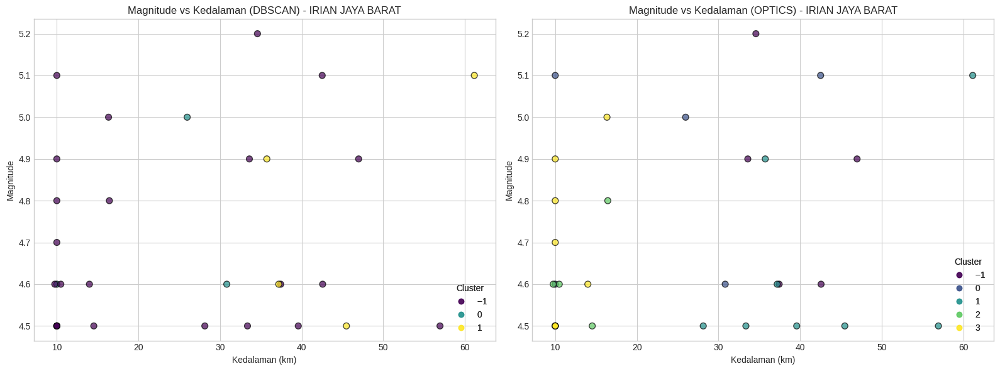


=== Analisis Karakteristik Cluster untuk Provinsi NUSA TENGGARA TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km               
                    mean  min  max count       mean   min      max
dbscan_cluster                                                    
-1              4.762500  4.5  5.4    24  83.536292  10.0  189.040
 0              4.933333  4.6  5.2     3  30.877000  10.0   42.657
 1              5.033333  4.9  5.1     3  10.000000  10.0   10.000


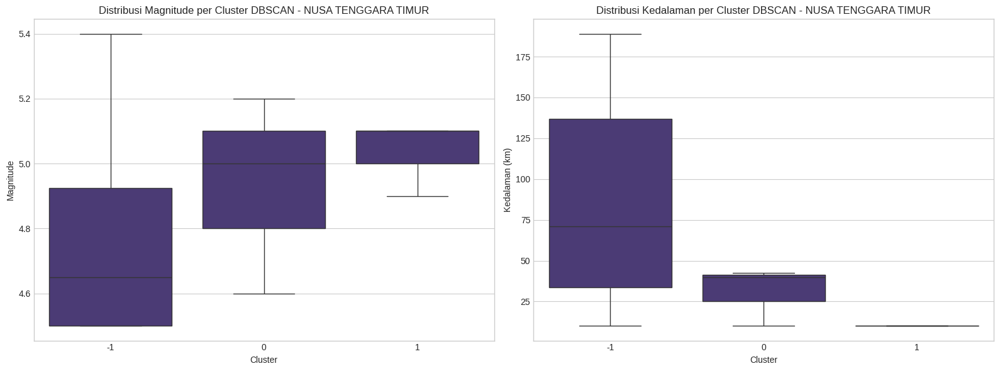


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km               
                    mean  min  max count        mean   min      max
optics_cluster                                                     
-1              4.662500  4.5  5.1     8  143.473250  10.0  189.040
 0              4.827273  4.5  5.4    11   44.075818  10.0  187.493
 1              4.890909  4.5  5.1    11   44.989273  10.0   83.827


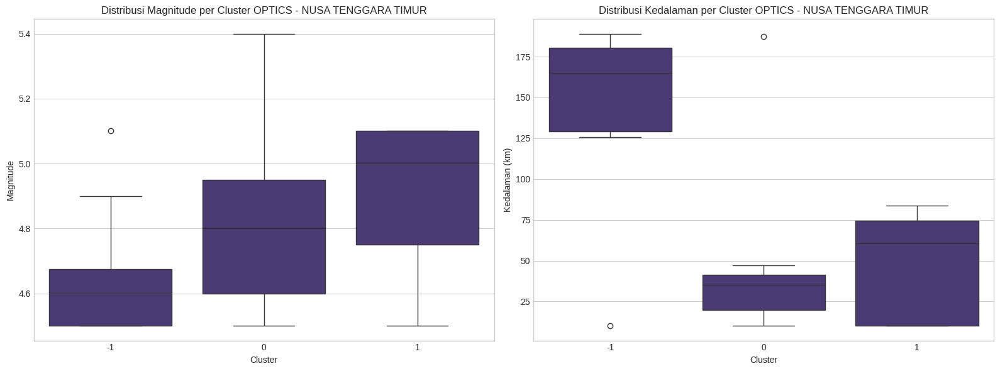


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1862


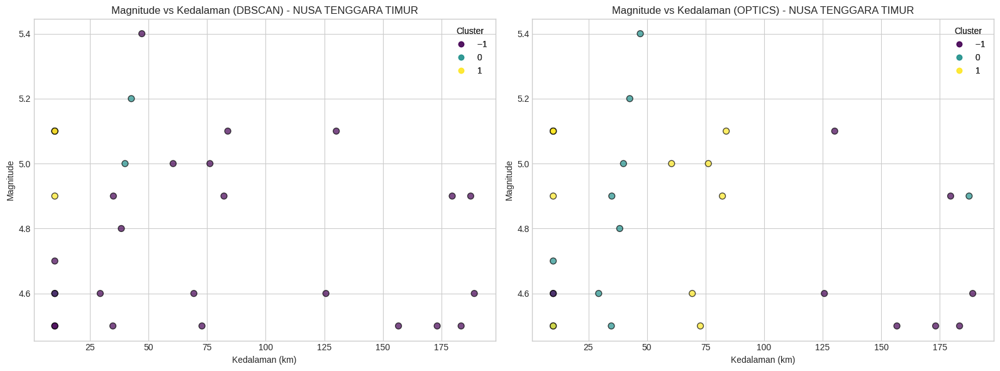


=== Analisis Karakteristik Cluster untuk Provinsi DI. ACEH ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.776471  4.5  6.3    17  42.800118  10.000  121.54
 0              4.722222  4.5  4.9     9  25.291778   5.550  154.36
 1              4.733333  4.5  5.0     3  75.266333   9.459  117.11


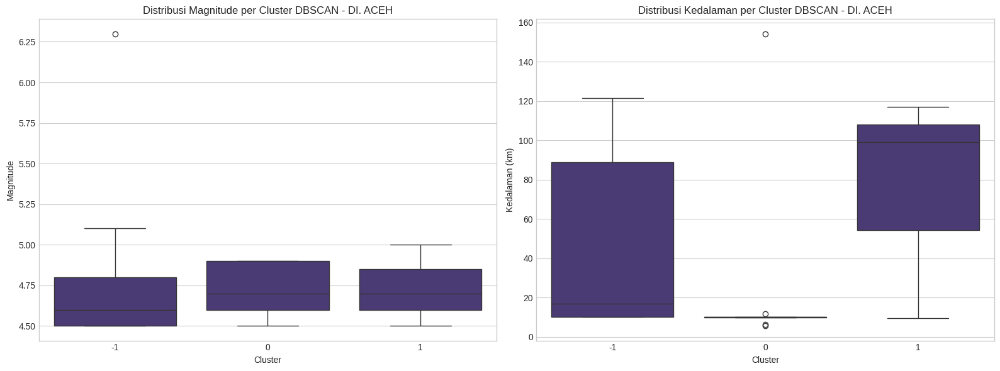


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
optics_cluster                                                     
-1              4.854545  4.5  6.3    11  34.682727  10.000  110.48
 0              4.625000  4.5  5.0     8  56.293875   9.459  117.11
 1              4.750000  4.5  5.0    10  34.916600   5.550  154.36


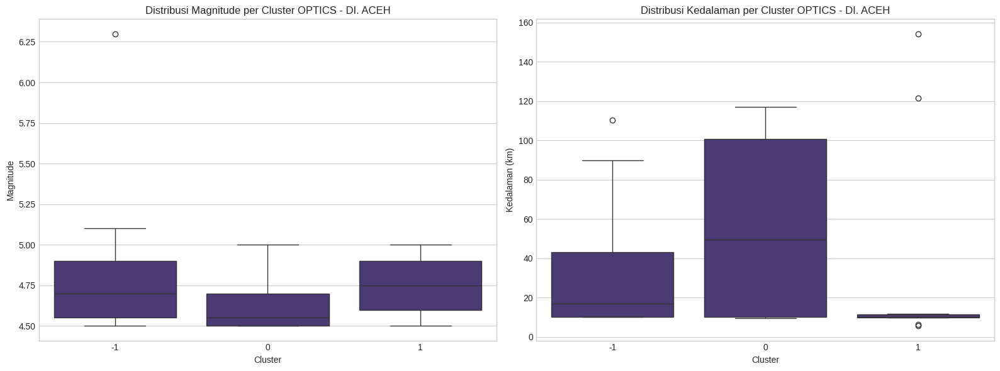


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.0307


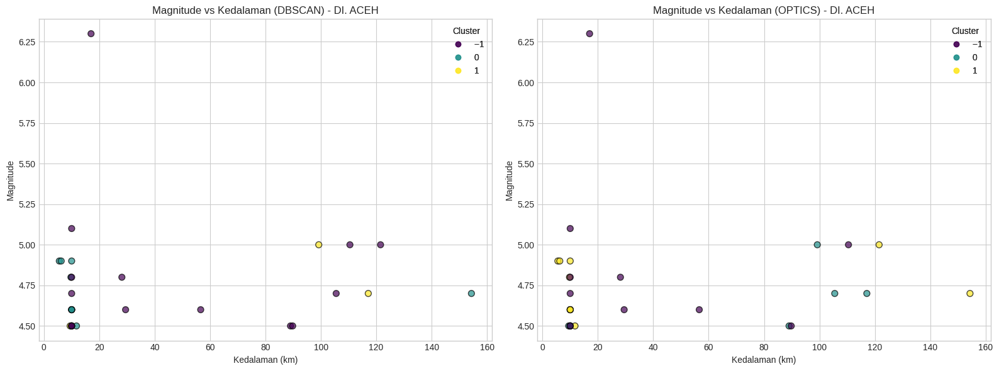


=== Analisis Karakteristik Cluster untuk Provinsi SUMATERA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean    min      max
dbscan_cluster                                                     
-1              5.071429  4.5  6.1    14  30.304714   4.00  140.516
 0              4.642857  4.5  4.9     7   9.304286   5.13   10.000
 1              5.300000  4.5  6.0     5  22.865200  10.00   43.000


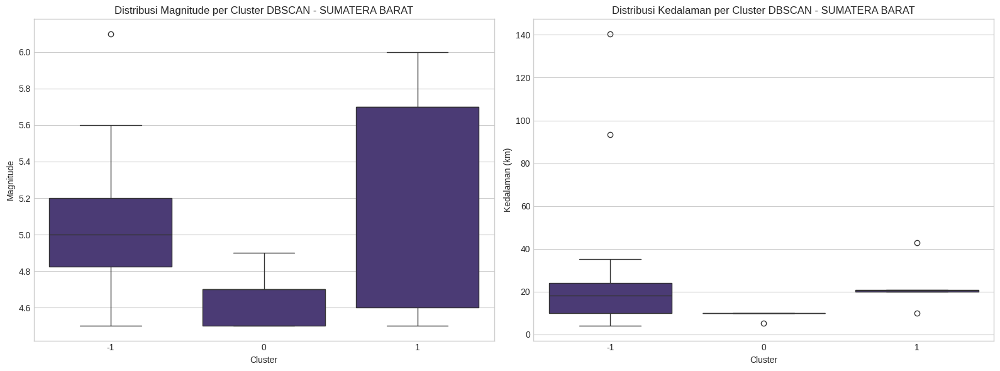


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km               
                    mean  min  max count       mean   min      max
optics_cluster                                                    
-1              5.100000  5.0  5.2     2  51.662500  10.0   93.325
 0              4.987500  4.5  5.6     8  19.553125  10.0   35.243
 1              5.300000  4.5  6.0     5  22.865200  10.0   43.000
 2              4.854545  4.5  6.1    11  20.876909   4.0  140.516


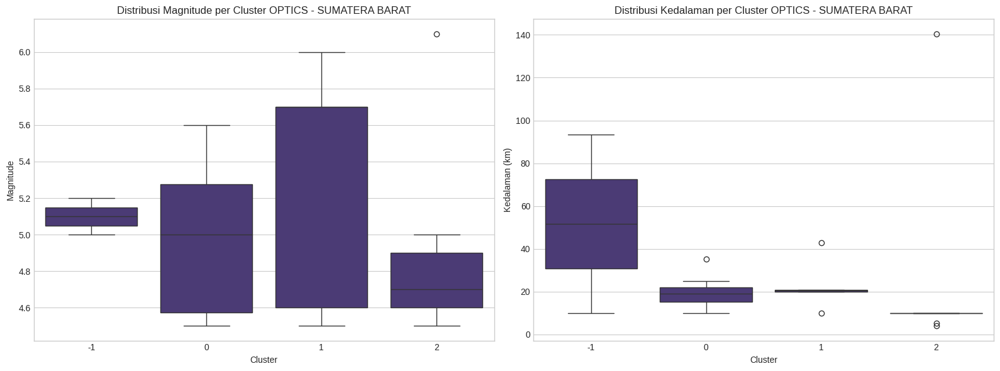


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.0304


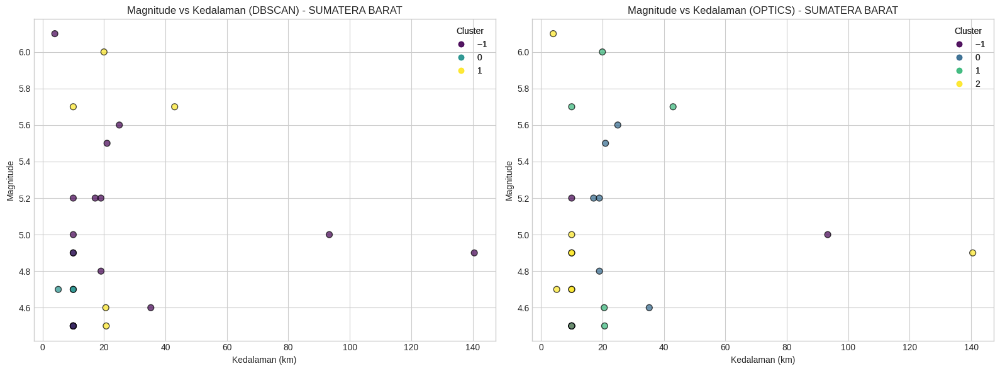


=== Analisis Karakteristik Cluster untuk Provinsi JAWA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.817647  4.5  5.8    17  65.449353  10.000  133.84
 0              4.925000  4.5  5.6     4  36.719500   6.878  120.00
 1              4.620000  4.5  5.0     5  59.453800  51.169   68.84


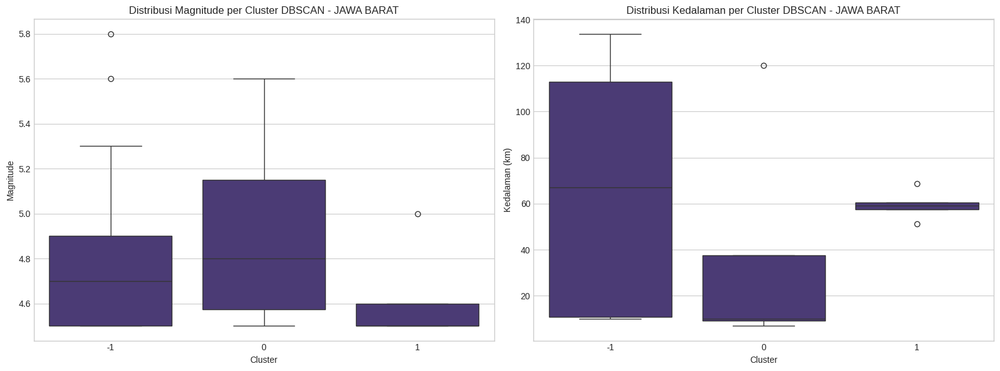


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
-1              4.725000  4.5  4.9     4  51.513750  10.000  114.644
 0              4.940000  4.5  5.8    10  57.227600  10.000  116.368
 1              4.757143  4.5  5.6     7  68.740857   6.878  133.840
 2              4.620000  4.5  5.0     5  59.453800  51.169   68.840


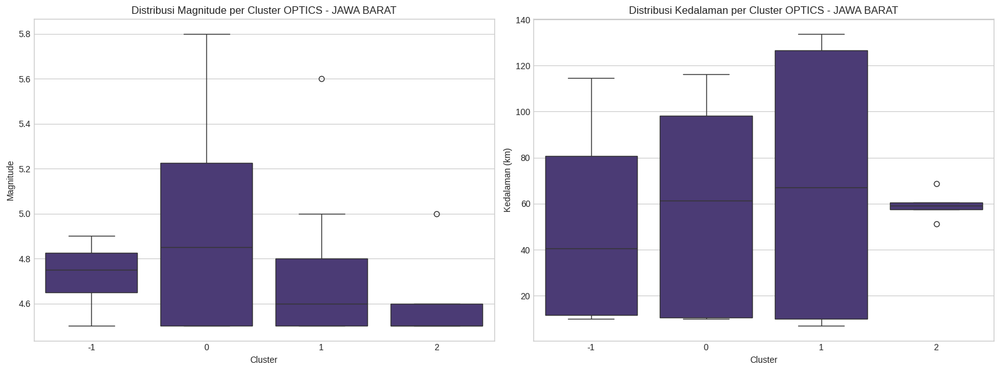


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.1367


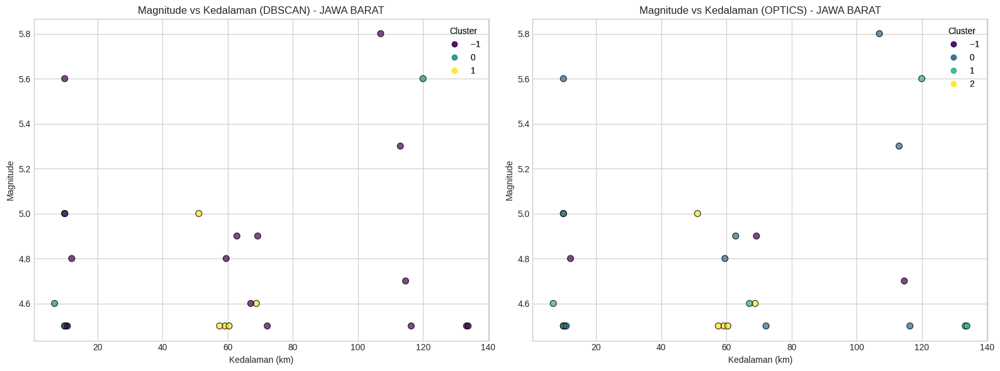


=== Analisis Karakteristik Cluster untuk Provinsi NUSATENGGARA BARAT ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.738462  4.5  5.1    13   48.922769   10.00  140.174
 0              4.571429  4.5  4.8     7  134.155429  122.94  143.567
 1              4.800000  4.7  5.0     3   10.000000   10.00   10.000


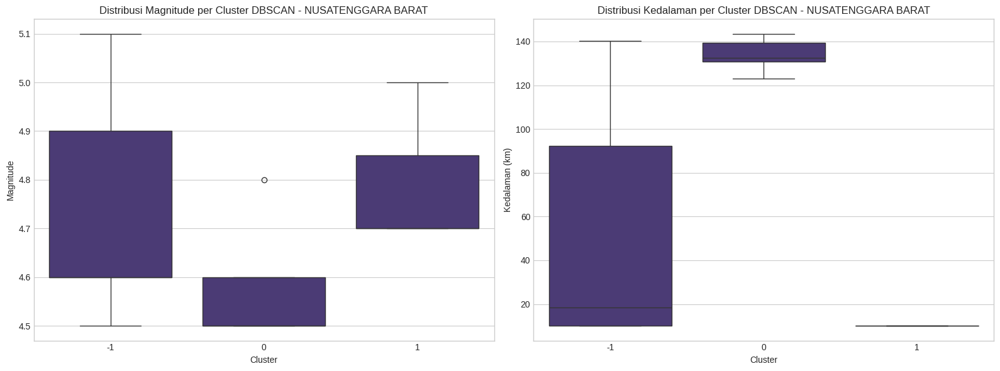


2. Karakteristik Cluster OPTICS:
               magnitude                  depth_km                
                    mean  min  max count      mean    min      max
optics_cluster                                                    
-1                  4.76  4.5  5.1    10   52.3776  10.00  140.174
 0                  4.72  4.6  5.0     5   10.0000  10.00   10.000
 1                  4.60  4.5  4.8     8  128.9135  92.22  143.567


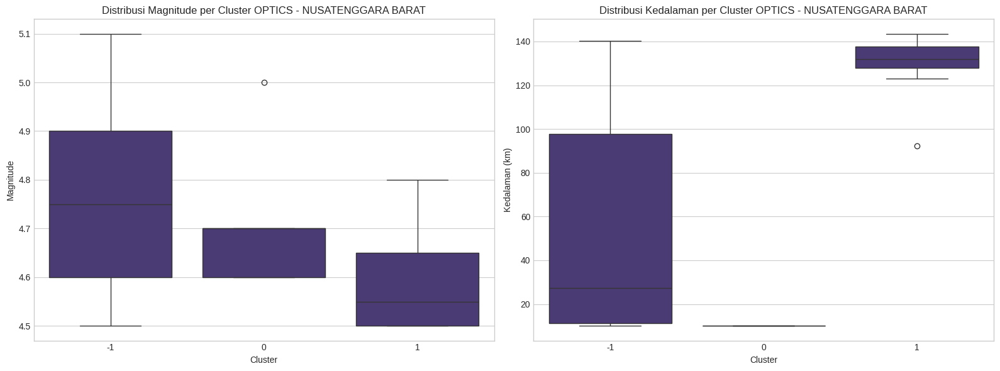


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.2502


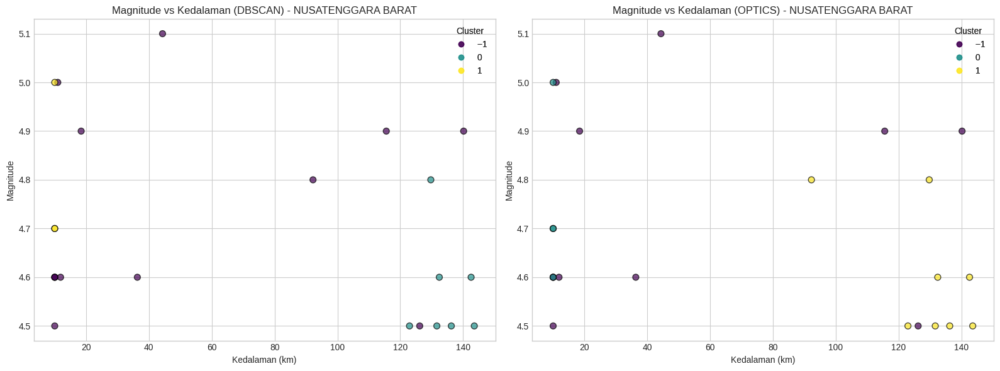


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI UTARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.740000  4.5  5.2     5  120.319000   22.47  179.240
 0              4.700000  4.5  5.3     8  239.288375  196.83  270.640
 1              4.671429  4.5  5.1     7   36.219429   10.00   55.036


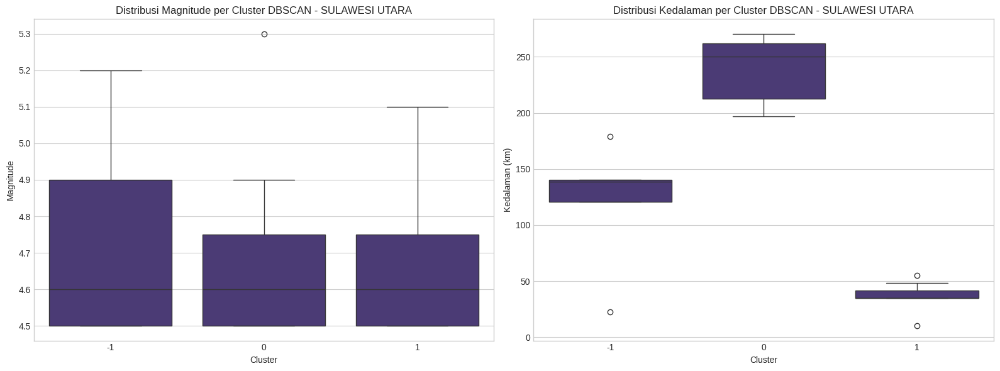


2. Karakteristik Cluster OPTICS:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
optics_cluster                                                       
-1              4.800000  4.5  5.2     4  115.288750   22.47  179.240
 0              4.677778  4.5  5.3     9  228.305222  140.44  270.640
 1              4.671429  4.5  5.1     7   36.219429   10.00   55.036


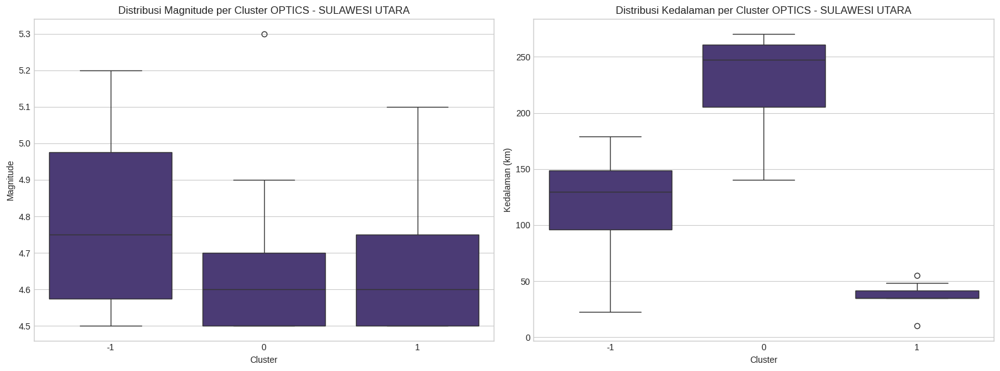


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0053


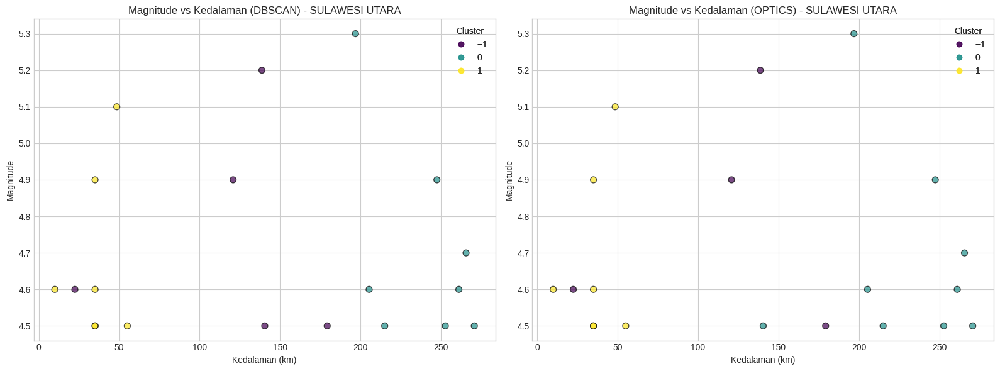


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI SELATAN ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km              
                    mean  min  max count     mean     min   max
dbscan_cluster                                                 
-1              4.833333  4.6  5.2     6   17.235  10.000  35.0
 0              4.675000  4.5  5.0     4    9.928   9.712  10.0
 1              5.380000  4.9  6.2     5   13.200  10.000  18.0


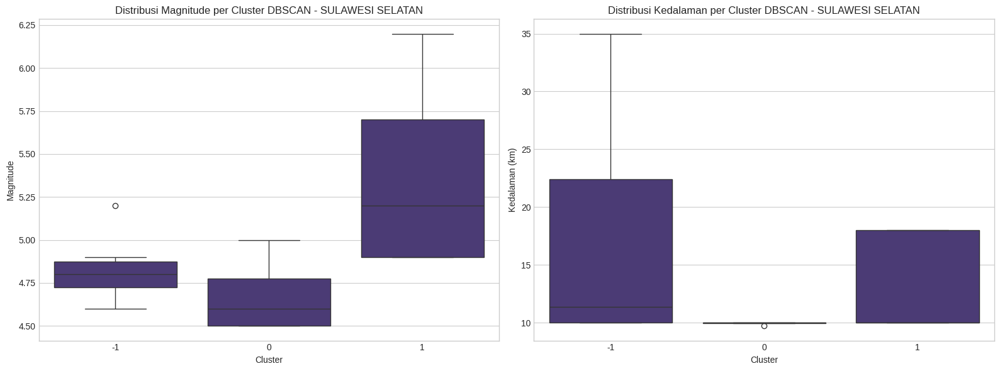


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km              
                    mean  min  max count     mean     min   max
optics_cluster                                                 
0                   4.70  4.5  5.0     5   9.9424   9.712  10.0
1                   5.11  4.6  6.2    10  15.9410  10.000  35.0


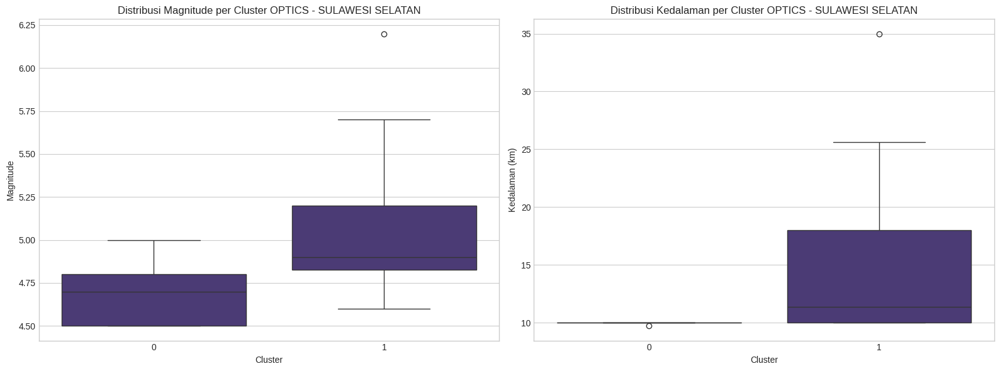


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.0911


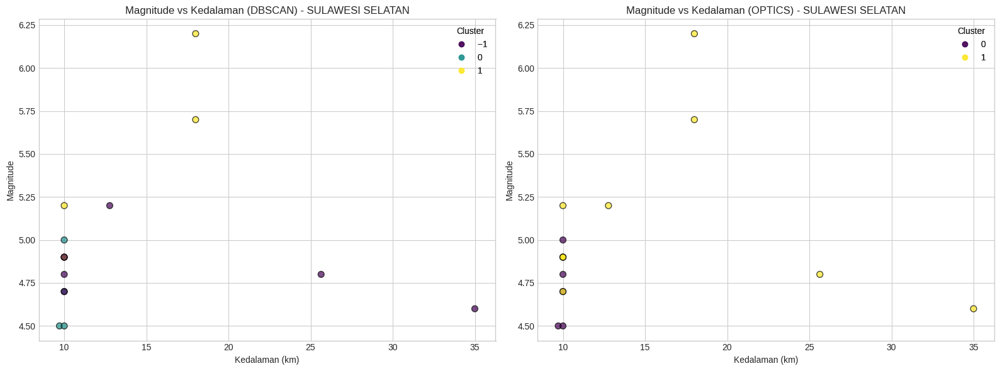


=== Analisis Karakteristik Cluster untuk Provinsi PROBANTEN ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1                  4.75  4.5  4.9     6   76.414667  10.000  154.129
 0                  4.80  4.6  4.9     4   44.741250  33.901   52.320
 1                  4.80  4.6  5.1     3  128.990000  96.850  149.600


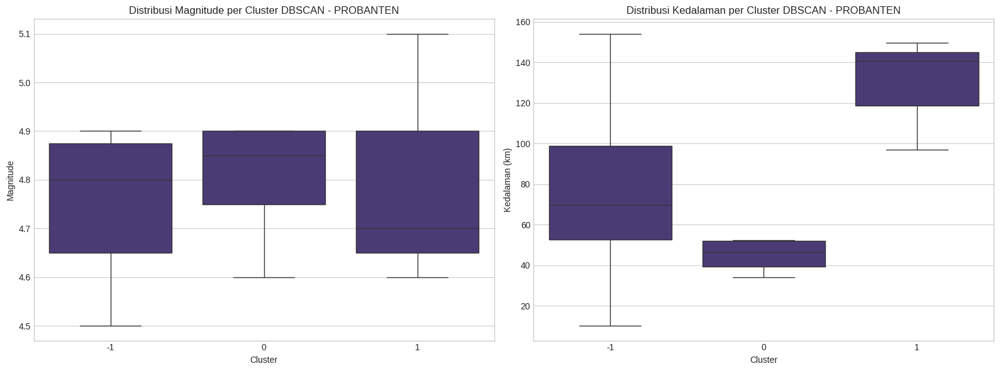


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km                 
                    mean  min  max count       mean     min      max
optics_cluster                                                      
0                 4.8000  4.6  4.9     5  45.622000  33.901   52.320
1                 4.7625  4.5  5.1     8  99.539125  10.000  154.129


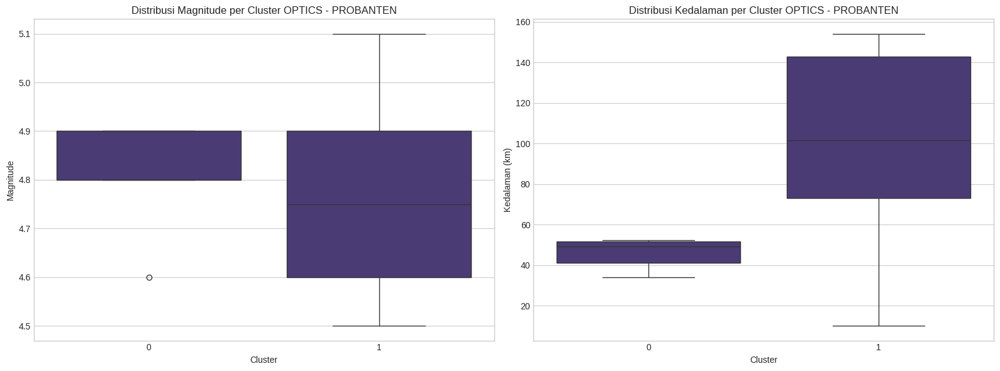


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.0125


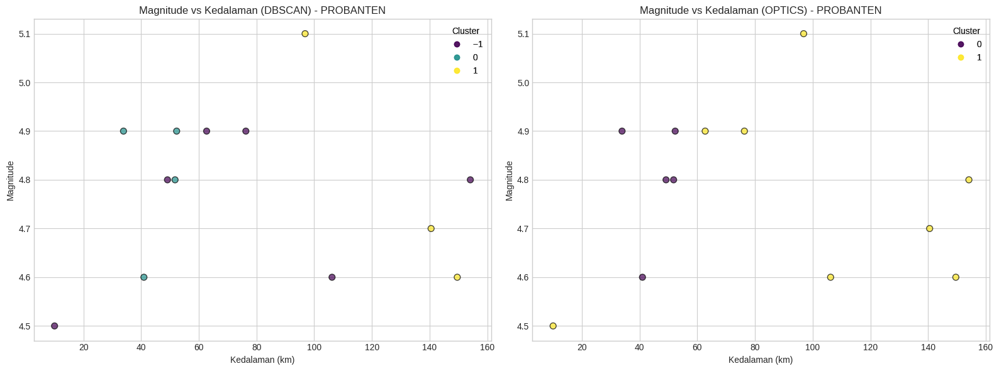


=== Analisis Karakteristik Cluster untuk Provinsi LAMPUNG ===

1. Karakteristik Cluster DBSCAN:
               magnitude                  depth_km                 
                    mean  min  max count      mean     min      max
dbscan_cluster                                                     
-1              4.625000  4.5  4.9     4  71.63025  10.261  105.480
 0              4.660000  4.5  5.1     5  50.35020  25.140  109.811
 1              4.533333  4.5  4.6     3  74.09000  57.490   83.730


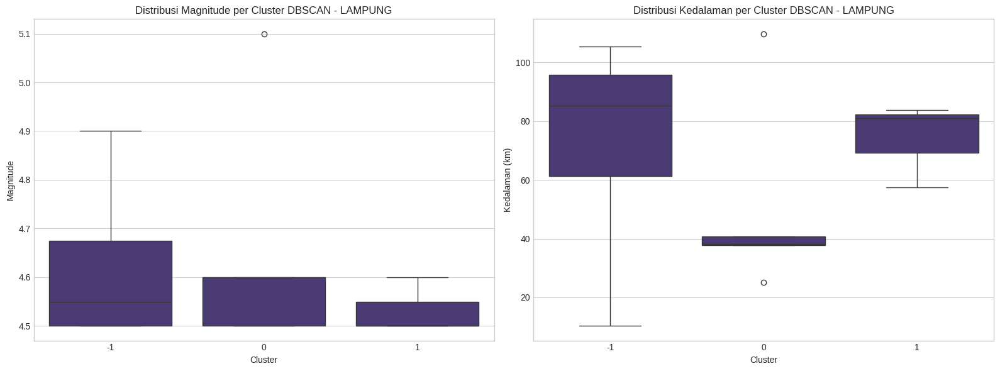


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km                 
                    mean  min  max count     mean     min      max
optics_cluster                                                    
0               4.616667  4.5  5.1    12  63.3785  10.261  109.811


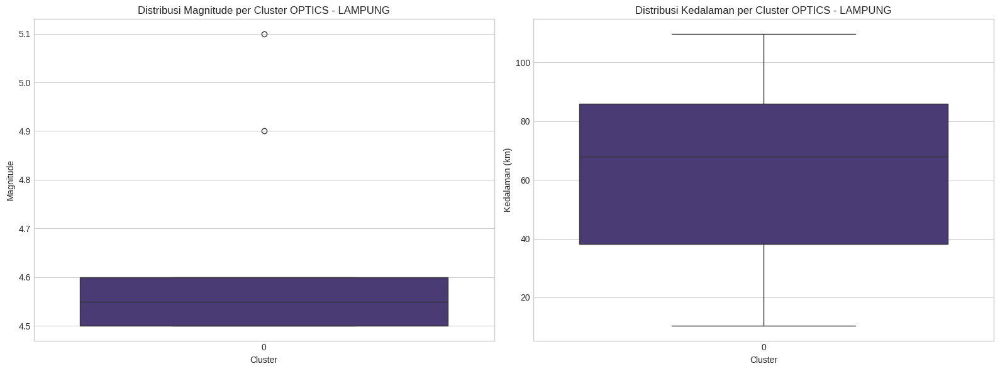


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.5951


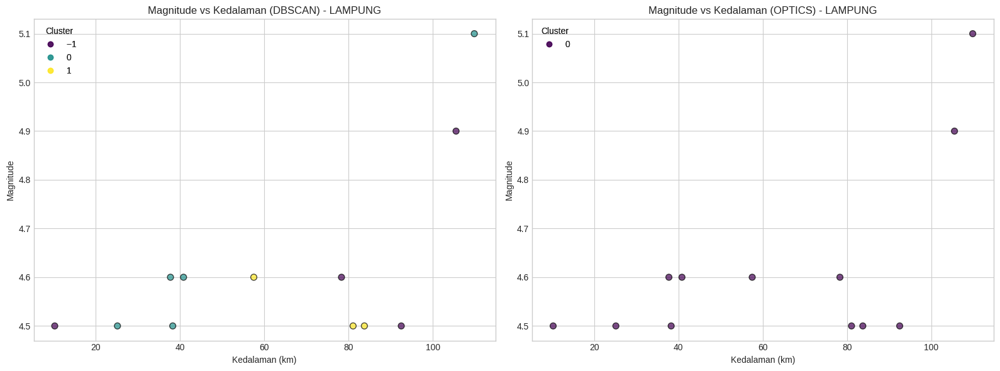


=== Analisis Karakteristik Cluster untuk Provinsi BENGKULU ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km                
                    mean  min  max count       mean     min     max
dbscan_cluster                                                     
-1              4.625000  4.5  4.8     4  98.220000  59.440  117.86
 0              4.566667  4.5  4.6     3  55.660667  10.862   88.82
 1              4.733333  4.5  5.1     3  68.984333  41.700   88.38


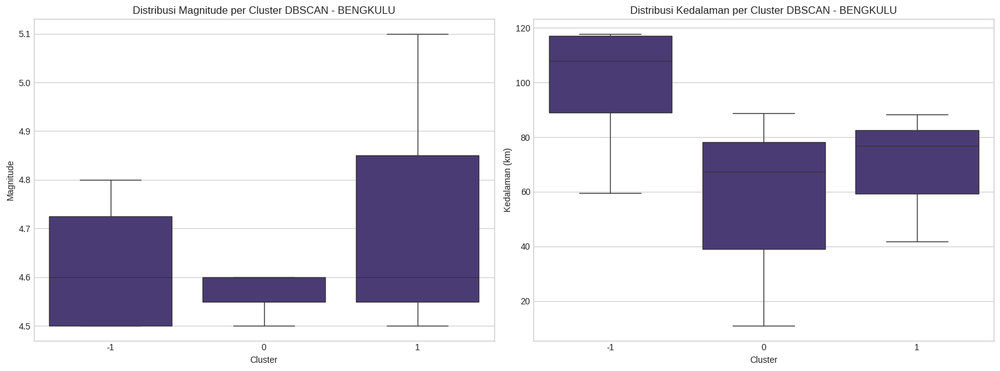


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km                
                    mean  min  max count     mean     min     max
optics_cluster                                                   
0                   4.64  4.5  5.1    10  76.6815  10.862  117.86


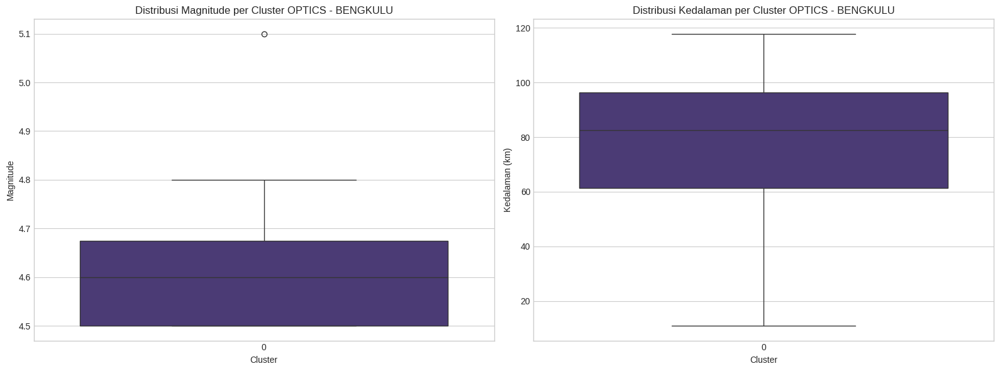


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.1922


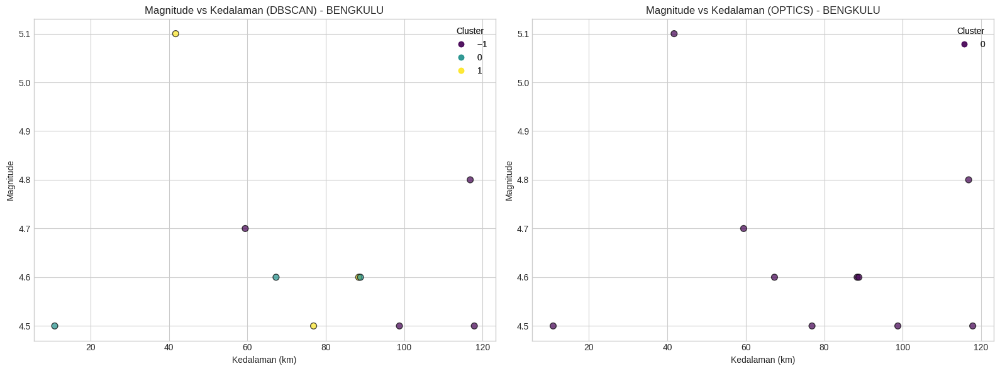


=== Analisis Karakteristik Cluster untuk Provinsi GORONTALO ===

1. Karakteristik Cluster DBSCAN:
               magnitude                    depth_km                 
                    mean  min  max count        mean     min      max
dbscan_cluster                                                       
-1              4.650000  4.5  4.9     4  133.923250  77.693  287.380
 0              4.700000  4.6  4.9     3  101.850333  95.410  111.821
 1              4.766667  4.7  4.9     3   88.796667  84.952   93.775


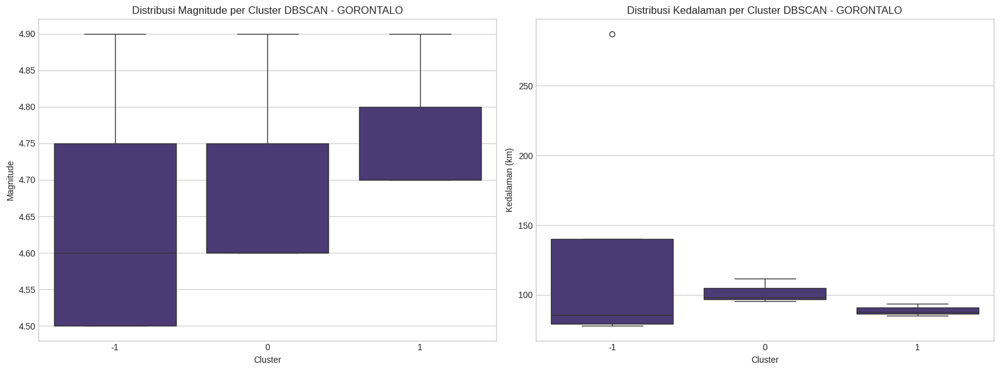


2. Karakteristik Cluster OPTICS:
               magnitude                  depth_km                
                    mean  min  max count      mean     min     max
optics_cluster                                                    
0                    4.7  4.5  4.9    10  110.7634  77.693  287.38


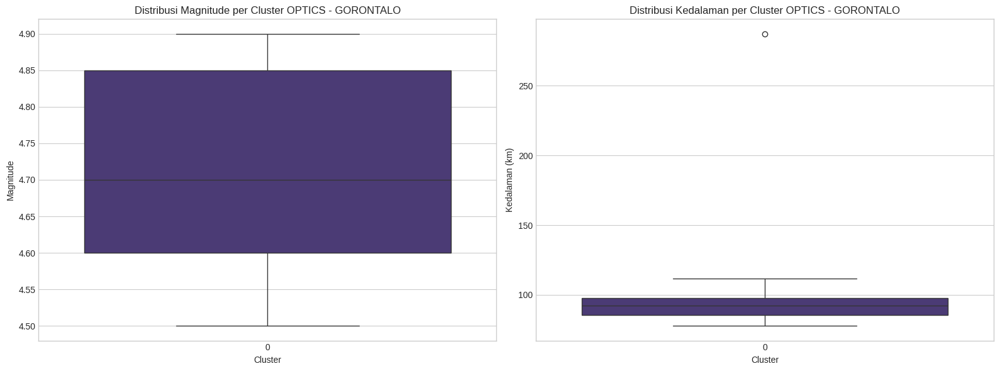


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.4780


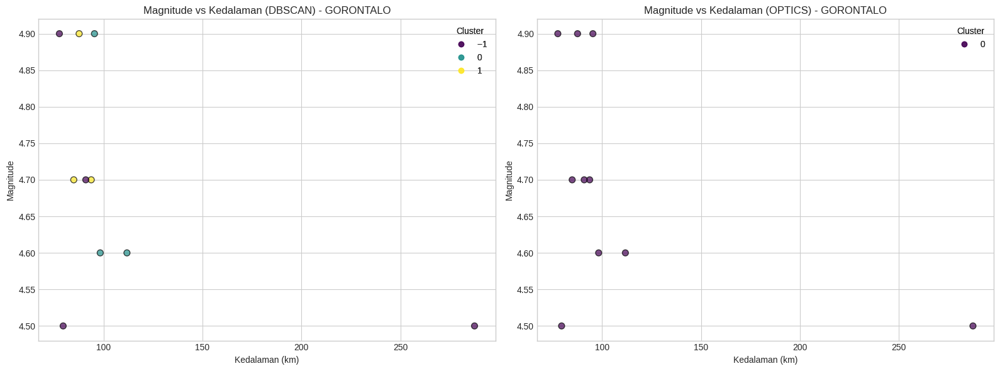


=== Analisis Karakteristik Cluster untuk Provinsi BALI ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km                
                    mean  min  max count     mean    min      max
dbscan_cluster                                                   
-2                   4.7  4.6  4.9     5  40.3718  9.992  161.867


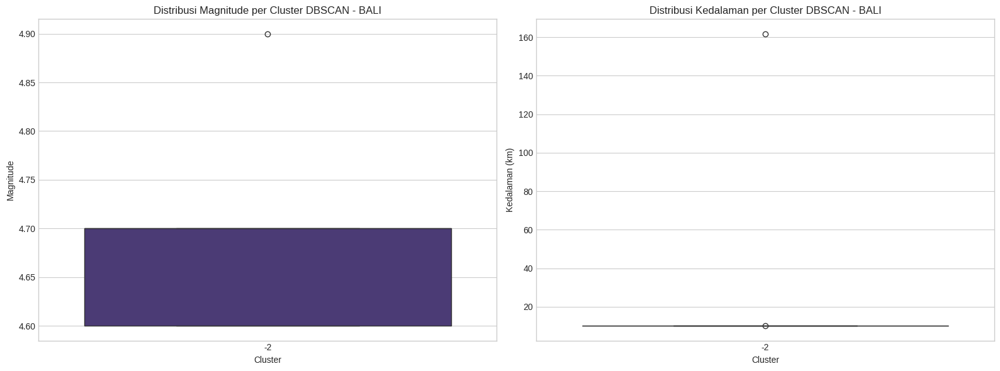


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km                
                    mean  min  max count     mean    min      max
optics_cluster                                                   
0                    4.7  4.6  4.9     5  40.3718  9.992  161.867


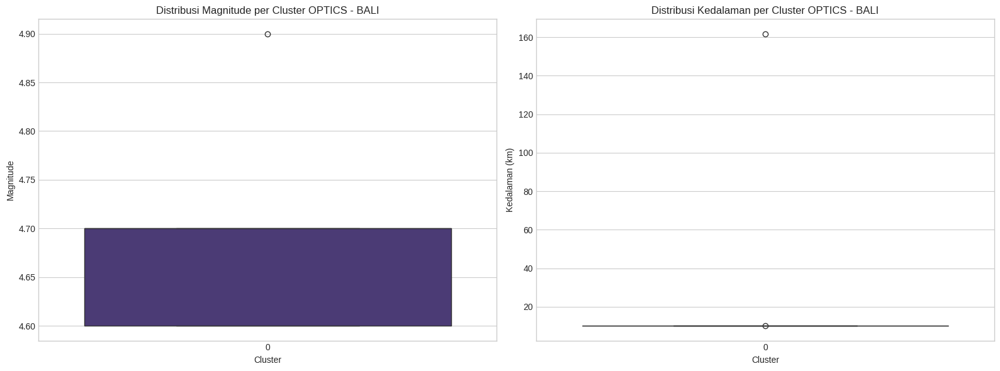


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.0000


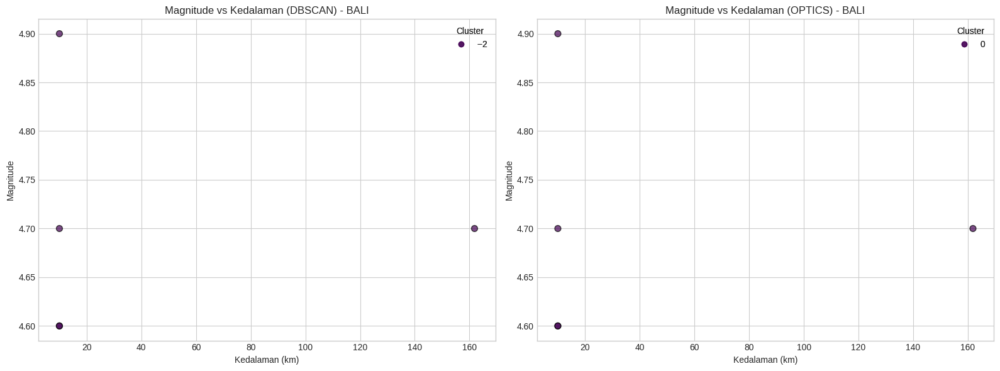


=== Analisis Karakteristik Cluster untuk Provinsi SULAWESI TENGGARA ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km             
                    mean  min  max count     mean   min    max
dbscan_cluster                                                
-2                  4.76  4.5  5.0     5   12.476  6.49  24.87


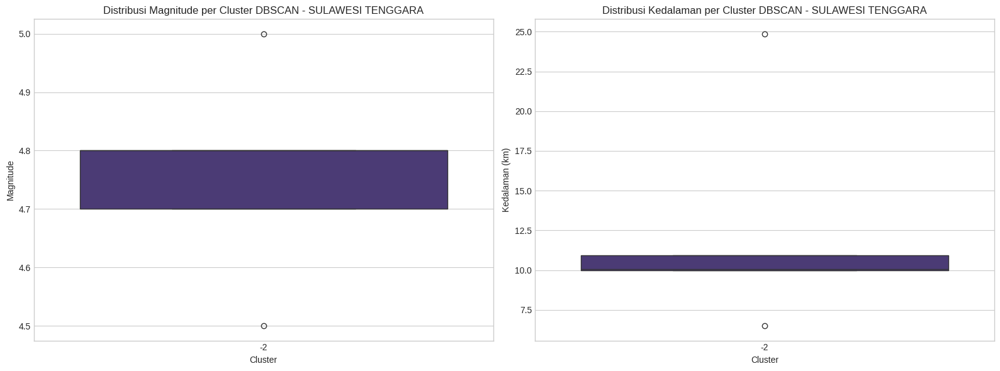


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km             
                    mean  min  max count     mean   min    max
optics_cluster                                                
0                   4.76  4.5  5.0     5   12.476  6.49  24.87


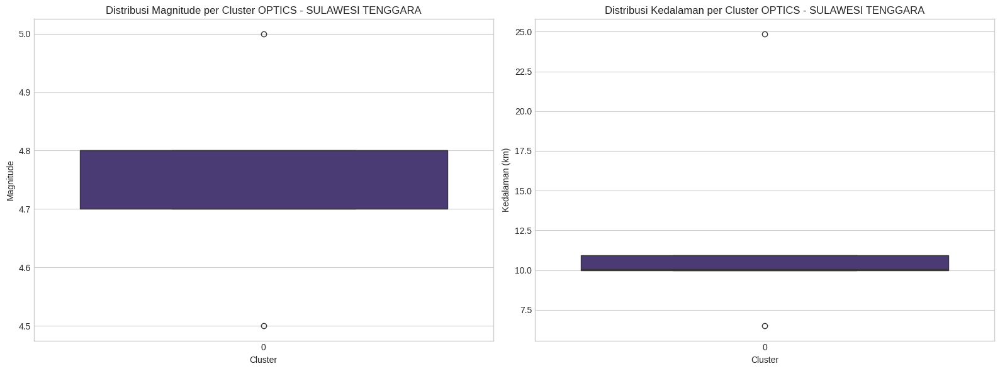


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.6941


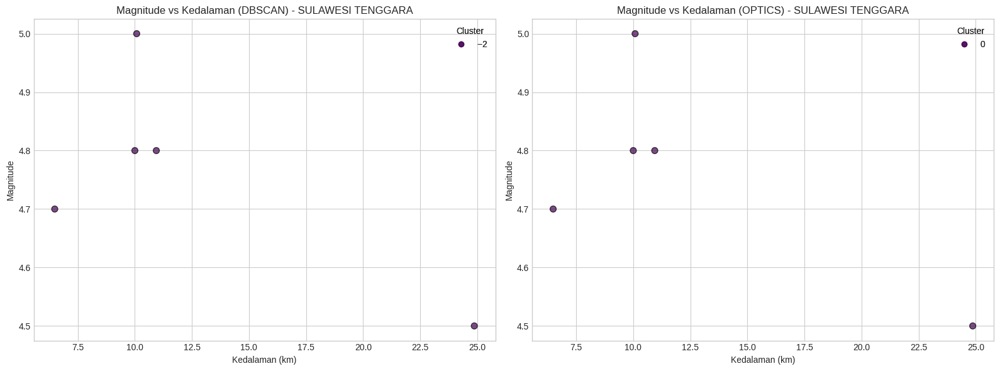


=== Analisis Karakteristik Cluster untuk Provinsi JAWA TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km                
                    mean  min  max count     mean    min      max
dbscan_cluster                                                   
-2                  4.72  4.5  5.1     5  107.717  95.26  117.578


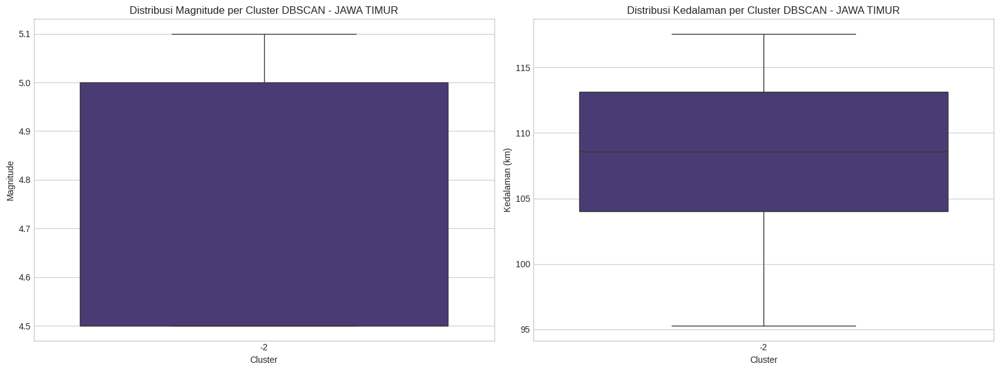


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km                
                    mean  min  max count     mean    min      max
optics_cluster                                                   
0                   4.72  4.5  5.1     5  107.717  95.26  117.578


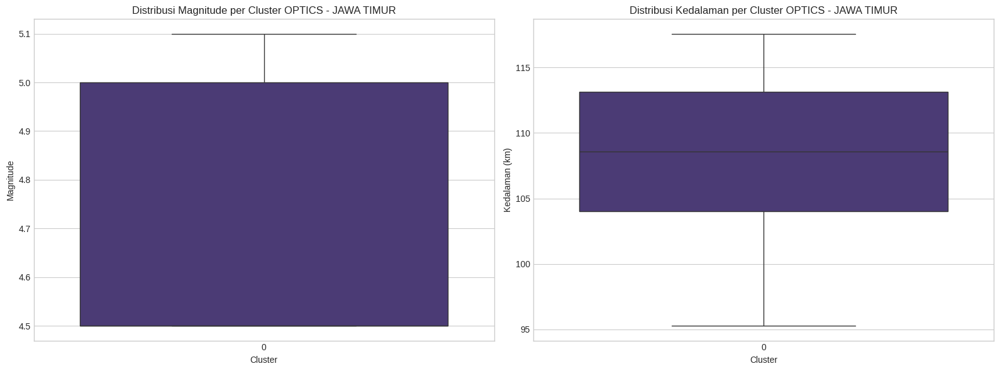


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.3539


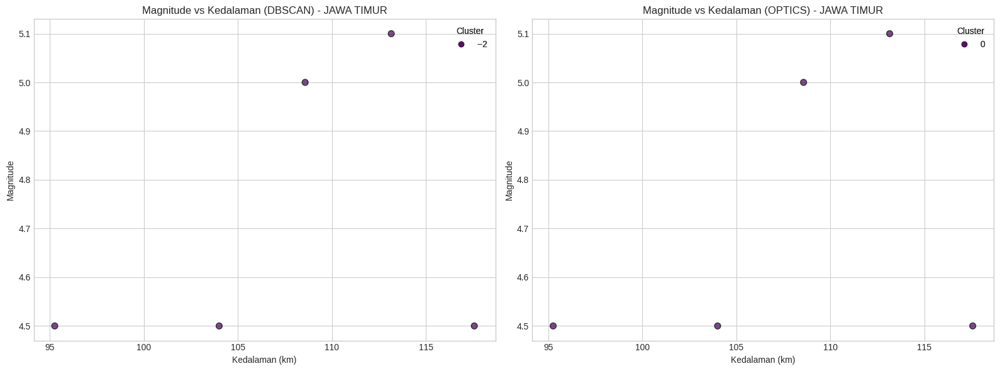


=== Analisis Karakteristik Cluster untuk Provinsi SUMATERA SELATAN ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km                
                    mean  min  max count     mean    min      max
dbscan_cluster                                                   
-2                  4.75  4.6  5.1     4  143.257  93.99  198.437


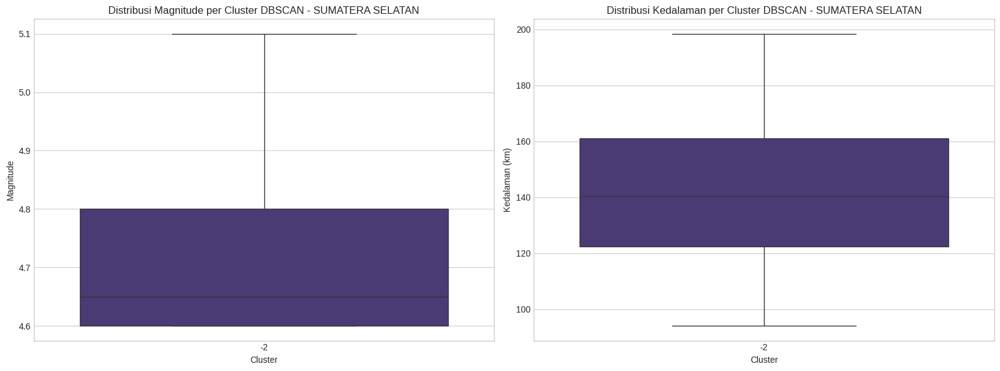


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km                
                    mean  min  max count     mean    min      max
optics_cluster                                                   
0                   4.75  4.6  5.1     4  143.257  93.99  198.437


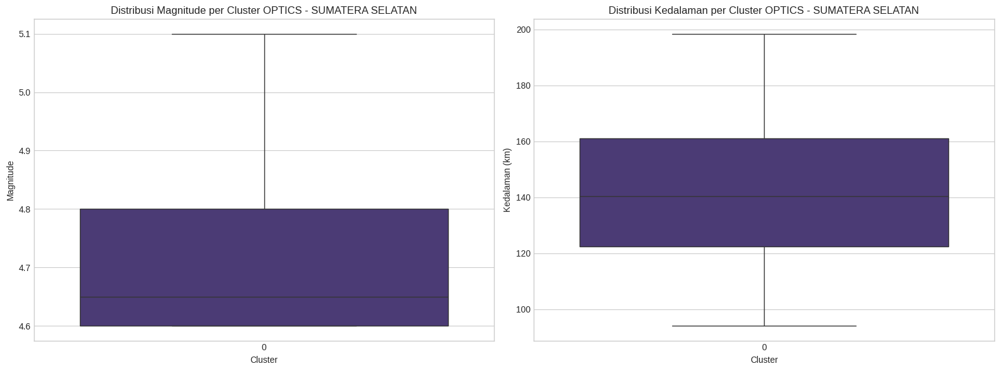


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.8329


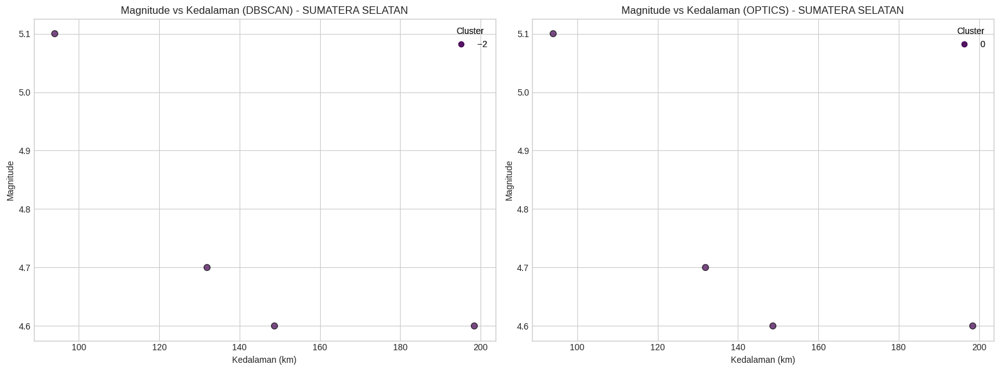


=== Analisis Karakteristik Cluster untuk Provinsi KALIMANTAN TIMUR ===

1. Karakteristik Cluster DBSCAN:
               magnitude                   depth_km              
                    mean  min  max count       mean    min    max
dbscan_cluster                                                   
-2              4.966667  4.6  5.5     3  23.168667  6.526  52.98


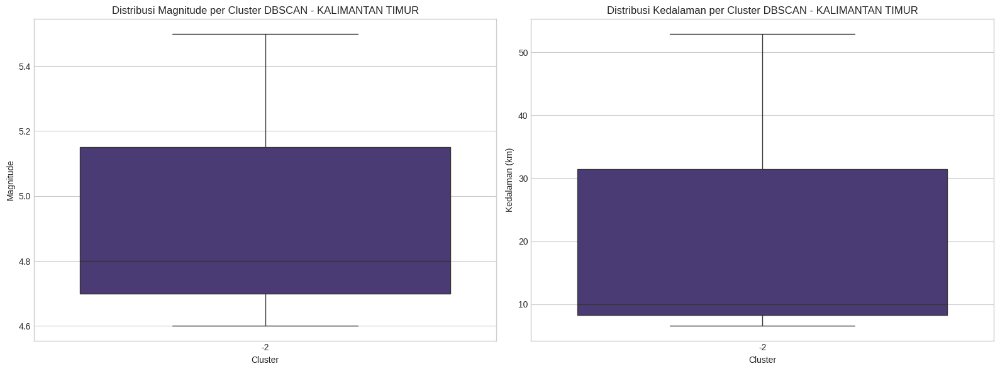


2. Karakteristik Cluster OPTICS:
               magnitude                   depth_km              
                    mean  min  max count       mean    min    max
optics_cluster                                                   
0               4.966667  4.6  5.5     3  23.168667  6.526  52.98


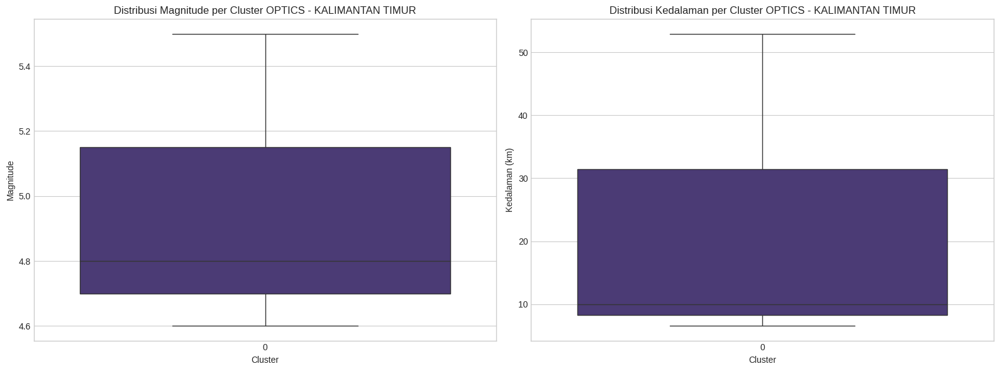


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: -0.7201


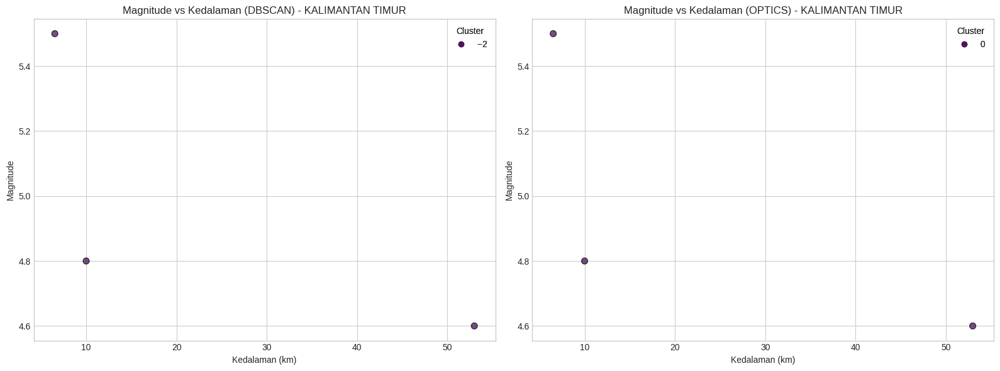


=== Analisis Karakteristik Cluster untuk Provinsi JAMBI ===

1. Karakteristik Cluster DBSCAN:
               magnitude                 depth_km                
                    mean  min  max count     mean      min    max
dbscan_cluster                                                   
-2              4.566667  4.5  4.7     3  177.195  149.115  212.8


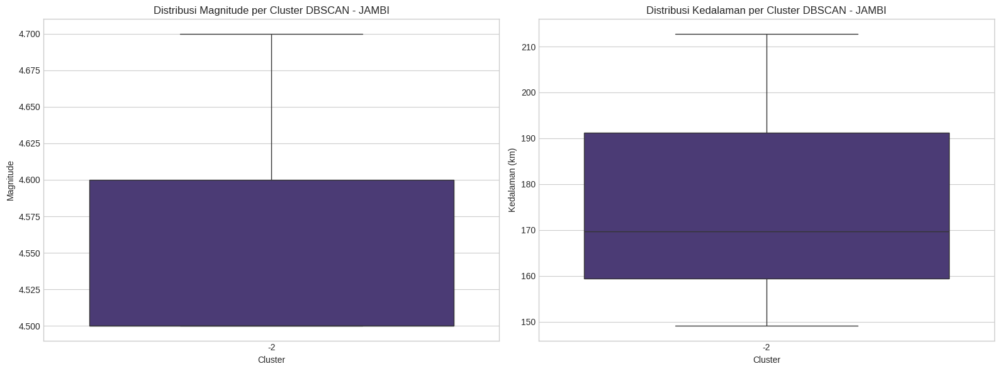


2. Karakteristik Cluster OPTICS:
               magnitude                 depth_km                
                    mean  min  max count     mean      min    max
optics_cluster                                                   
0               4.566667  4.5  4.7     3  177.195  149.115  212.8


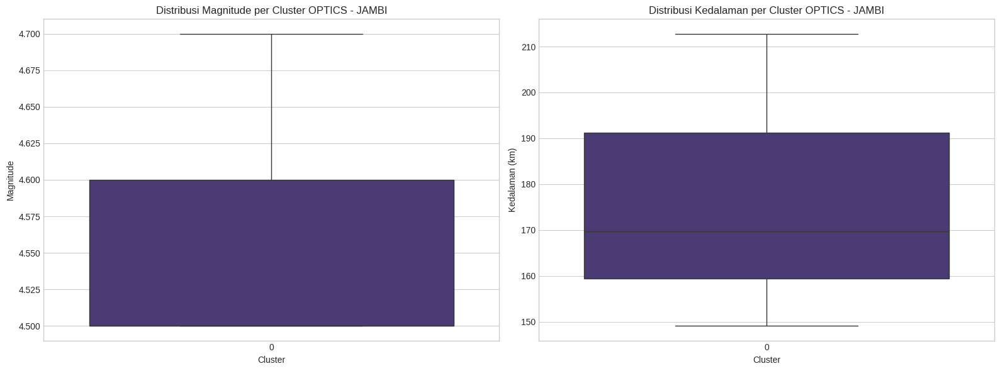


3. Korelasi antara Magnitude dan Kedalaman:
Korelasi Pearson: 0.9487


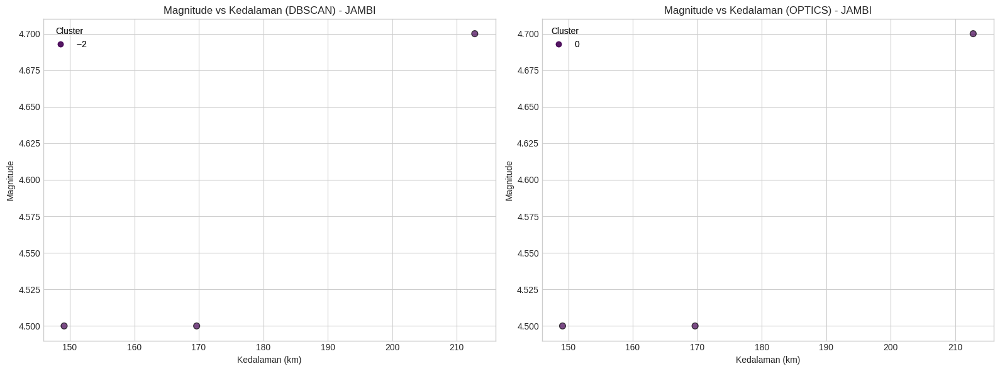

In [ ]:
# Analisis karakteristik cluster untuk setiap provinsi
for province_name, province_results in hasil.items():
    analyze_cluster_characteristics(province_name, province_results)

## 7. Perbandingan Hasil Clustering DBSCAN dan OPTICS

In [ ]:
# Buat tabel perbandingan hasil clustering DBSCAN dan OPTICS
comparison_data = []

for province_name, province_results in hasil.items():
    dbscan_results = province_results['dbscan']
    optics_results = province_results['optics']

    comparison_data.append({
        'Provinsi': province_name,
        'Jumlah Gempa': len(province_results['data']),
        'DBSCAN Clusters': dbscan_results['n_clusters'],
        'DBSCAN Noise (%)': dbscan_results['n_noise'] / len(province_results['data']) * 100 if len(province_results['data']) > 0 else 0,
        'DBSCAN Silhouette': dbscan_results['silhouette'],
        'OPTICS Clusters': optics_results['n_clusters'],
        'OPTICS Noise (%)': optics_results['n_noise'] / len(province_results['data']) * 100 if len(province_results['data']) > 0 else 0,
        'OPTICS Silhouette': optics_results['silhouette']
    })

comparison_df = pd.DataFrame(comparison_data)
comparison_df = comparison_df.sort_values('Jumlah Gempa', ascending=False)

# Format nilai untuk tampilan yang lebih baik
comparison_df['DBSCAN Noise (%)'] = comparison_df['DBSCAN Noise (%)'].round(2)
comparison_df['OPTICS Noise (%)'] = comparison_df['OPTICS Noise (%)'].round(2)
comparison_df['DBSCAN Silhouette'] = comparison_df['DBSCAN Silhouette'].round(4)
comparison_df['OPTICS Silhouette'] = comparison_df['OPTICS Silhouette'].round(4)

# Tampilkan tabel perbandingan
print("Perbandingan Hasil Clustering DBSCAN dan OPTICS per Provinsi:")
comparison_df

Perbandingan Hasil Clustering DBSCAN dan OPTICS per Provinsi:


,Provinsi,Jumlah Gempa,DBSCAN Clusters,DBSCAN Noise (%),DBSCAN Silhouette,OPTICS Clusters,OPTICS Noise (%),OPTICS Silhouette
0,IRIAN JAYA TIMUR,167,2,73.05,0.8510,8,38.92,0.7180
1,MALUKU,60,2,18.33,0.8285,5,45.00,0.7613
2,MALUKU UTARA,57,2,66.67,0.9077,4,10.53,0.7153
3,SUMATERA UTARA,35,2,48.57,0.6590,4,48.57,0.5277
4,SULAWESI TENGAH,34,2,35.29,0.8385,3,20.59,0.5711
5,IRIAN JAYA TENGAH,33,2,78.79,0.9304,3,27.27,0.5961
6,IRIAN JAYA BARAT,31,2,77.42,0.8815,4,16.13,0.4750
7,NUSA TENGGARA TIMUR,30,2,80.00,0.9885,2,26.67,0.8316
8,DI. ACEH,29,2,58.62,0.8147,2,37.93,0.6577
9,SUMATERA BARAT,26,2,53.85,0.9391,3,7.69,0.7875


<Figure size 1500x1000 with 0 Axes>

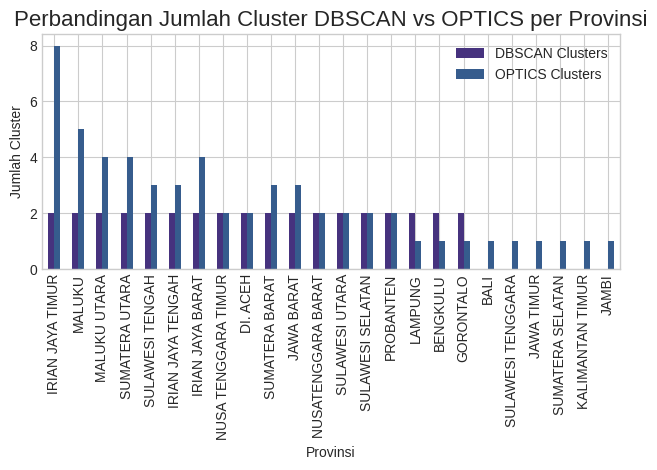

In [ ]:
# Visualisasi perbandingan jumlah cluster
plt.figure(figsize=(15, 10))
comparison_df.plot(x='Provinsi', y=['DBSCAN Clusters', 'OPTICS Clusters'], kind='bar')
plt.title('Perbandingan Jumlah Cluster DBSCAN vs OPTICS per Provinsi', fontsize=16)
plt.xlabel('Provinsi')
plt.ylabel('Jumlah Cluster')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

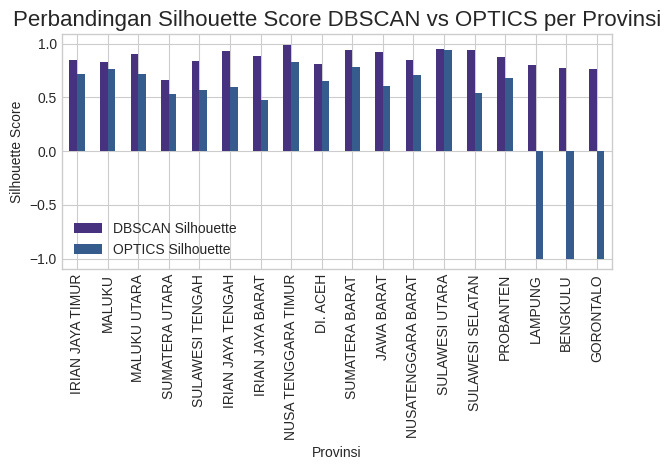

In [ ]:
# Visualisasi perbandingan silhouette score
# Filter provinsi dengan silhouette score valid (> -1)
valid_silhouette = comparison_df[(comparison_df['DBSCAN Silhouette'] > -1) | (comparison_df['OPTICS Silhouette'] > -1)]

plt.figure(figsize=(15, 10))
valid_silhouette.plot(x='Provinsi', y=['DBSCAN Silhouette', 'OPTICS Silhouette'], kind='bar')
plt.title('Perbandingan Silhouette Score DBSCAN vs OPTICS per Provinsi', fontsize=16)
plt.xlabel('Provinsi')
plt.ylabel('Silhouette Score')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## 9. Simpan Hasil Clustering

In [ ]:
# Gabungkan hasil clustering dari semua provinsi
all_clustered_data = []

for province_name, province_results in hasil.items():
    province_data = province_results['data'].copy()
    all_clustered_data.append(province_data)

# Gabungkan dengan data gempa yang tidak memiliki provinsi (di luar batas Indonesia)
non_province_data = gdf_earthquakes_with_province[gdf_earthquakes_with_province['Propinsi'].isna()].copy()
non_province_data['dbscan_cluster'] = -2  # Special label for points outside province boundaries
non_province_data['optics_cluster'] = -2  # Special label for points outside province boundaries
all_clustered_data.append(non_province_data)

# Gabungkan semua data
final_data = pd.concat(all_clustered_data)

# Simpan hasil ke CSV
final_data.to_csv('gempa_clustering_per_provinsi_results.csv', index=False)

print(f"Hasil clustering telah disimpan ke 'gempa_clustering_per_provinsi_results.csv'")

Hasil clustering telah disimpan ke 'gempa_clustering_per_provinsi_results.csv'


## 10. Visualisasi Akhir: Peta Clustering Seluruh Indonesia

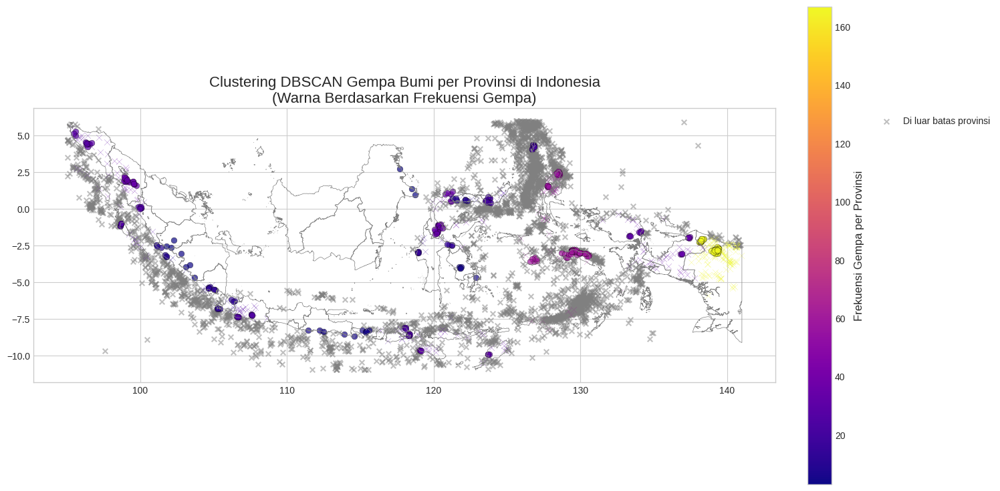

In [ ]:
import matplotlib.colors as mcolors

# Hitung frekuensi gempa tiap provinsi
province_freq = final_data['Propinsi'].value_counts()

# Normalisasi frekuensi untuk colormap (0 - 1)
norm = mcolors.Normalize(vmin=province_freq.min(), vmax=province_freq.max())
cmap = plt.cm.plasma  # Colormap gradiasi biru ke merah

# Buat peta warna berbasis frekuensi
province_color_map = {province: cmap(norm(freq)) for province, freq in province_freq.items()}

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plot batas provinsi
provinces.boundary.plot(ax=ax, linewidth=0.5, color='gray')

# Plot gempa di luar batas provinsi
outside_mask = final_data['Propinsi'].isna()
ax.scatter(final_data.loc[outside_mask, 'longitude'],
           final_data.loc[outside_mask, 'latitude'],
           c='gray', s=30, alpha=0.5, marker='x', label='Di luar batas provinsi')

# Create province_list from the keys of the hasil dictionary
province_list = list(hasil.keys())

# Plot gempa tiap provinsi, warnanya berdasar frekuensi provinsi
for province in province_list:
    province_mask = final_data['Propinsi'] == province
    province_data = final_data[province_mask]
    color = province_color_map.get(province, 'black')

    for cluster in sorted(province_data['dbscan_cluster'].unique()):
        if cluster == -1:
            marker = 'x'
            label = f'{province} (Noise)' if province_data['dbscan_cluster'].eq(-1).sum() > 10 else None
            alpha = 0.5
        else:
            marker = 'o'
            label = None  # Legend diganti dengan colormap di colorbar
            alpha = 0.7

        cluster_mask = province_data['dbscan_cluster'] == cluster
        ax.scatter(province_data.loc[cluster_mask, 'longitude'],
                   province_data.loc[cluster_mask, 'latitude'],
                   c=[color], s=40, alpha=alpha,
                   marker=marker, edgecolor='k', linewidth=0.3,
                   label=label)

# Judul
ax.set_title('Clustering DBSCAN Gempa Bumi per Provinsi di Indonesia\n(Warna Berdasarkan Frekuensi Gempa)', fontsize=16)

# Buat colorbar untuk frekuensi
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Dummy data
cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label('Frekuensi Gempa per Provinsi', fontsize=12)

# Legend untuk noise/outside only
handles, labels = ax.get_legend_handles_labels()
new_handles_labels = [(h, l) for h, l in zip(handles, labels) if l in ['Di luar batas provinsi']]
if new_handles_labels:
    new_handles, new_labels = zip(*new_handles_labels)
    ax.legend(new_handles, new_labels, loc='upper right', bbox_to_anchor=(1.3, 1))

plt.tight_layout()
plt.savefig('clustering_dbscan_per_provinsi_frekuensi.png', dpi=300, bbox_inches='tight')
plt.show()

### 8.1 Kesimpulan

Berdasarkan analisis clustering spasial per provinsi yang telah dilakukan, dapat disimpulkan bahwa:

1. **Distribusi Gempa Bumi**: Gempa bumi di Indonesia tidak terdistribusi secara merata di seluruh provinsi. Beberapa provinsi seperti Maluku, Papua, dan Sulawesi memiliki frekuensi gempa yang lebih tinggi dibandingkan provinsi lainnya.

2. **Pola Clustering**: Algoritma DBSCAN dan OPTICS berhasil mengidentifikasi cluster gempa bumi di setiap provinsi dengan karakteristik yang berbeda-beda. Pola clustering ini mencerminkan aktivitas seismik yang berbeda di setiap wilayah.

3. **Perbandingan DBSCAN dan OPTICS**:
   - DBSCAN cenderung menghasilkan cluster yang lebih terdefinisi dengan baik, tetapi sensitif terhadap parameter eps dan min_samples.
   - OPTICS lebih fleksibel dalam mendeteksi cluster dengan densitas yang bervariasi, tetapi terkadang menghasilkan lebih banyak noise points.

4. **Karakteristik Cluster**:
   - Beberapa cluster menunjukkan korelasi antara magnitude dan kedalaman gempa.
   - Cluster di zona subduksi umumnya memiliki kedalaman yang lebih bervariasi.
   - Cluster di sekitar patahan aktif cenderung memiliki kedalaman yang lebih dangkal.

5. **Provinsi dengan Aktivitas Seismik Rendah**:
   - Beberapa provinsi seperti Kalimantan Barat, Kalimantan Tengah, dan Kalimantan Timur memiliki aktivitas seismik yang sangat rendah.
   - Provinsi-provinsi di Jawa memiliki pola gempa yang berbeda dibandingkan dengan provinsi di Indonesia Timur.

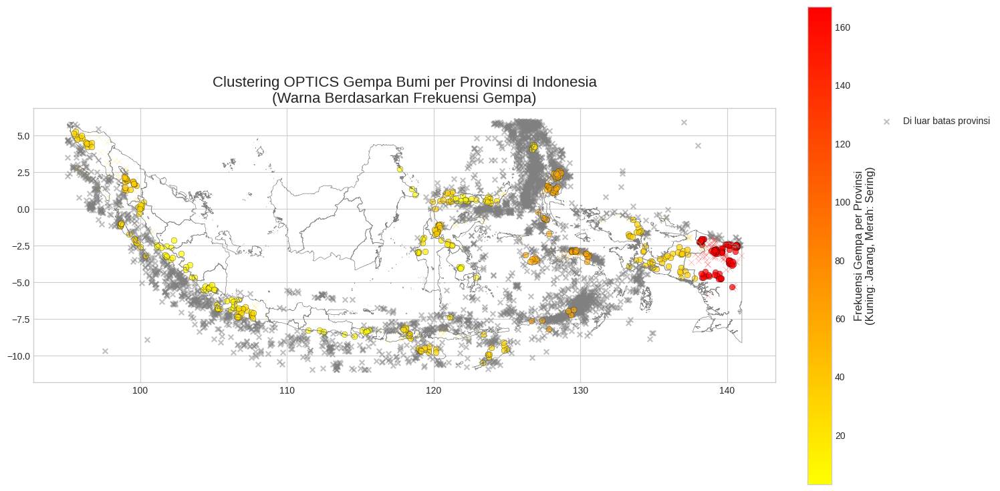

In [30]:
import matplotlib.colors as mcolors

# Hitung frekuensi gempa tiap provinsi
province_freq = final_data['Propinsi'].value_counts()

# Normalisasi frekuensi (0 - 1)
norm = mcolors.Normalize(vmin=province_freq.min(), vmax=province_freq.max())
cmap = plt.cm.autumn_r  # autumn_r: kuning -> merah

# Peta warna provinsi berbasis frekuensi
province_color_map = {province: cmap(norm(freq)) for province, freq in province_freq.items()}

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

# Plot batas provinsi
provinces.boundary.plot(ax=ax, linewidth=0.5, color='gray')

# Gempa di luar batas provinsi
outside_mask = final_data['Propinsi'].isna()
ax.scatter(final_data.loc[outside_mask, 'longitude'],
           final_data.loc[outside_mask, 'latitude'],
           c='gray', s=30, alpha=0.5, marker='x', label='Di luar batas provinsi')

# Gempa tiap provinsi
for province in province_list:
    province_mask = final_data['Propinsi'] == province
    province_data = final_data[province_mask]
    color = province_color_map.get(province, 'black')

    for cluster in sorted(province_data['optics_cluster'].unique()):
        if cluster == -1:
            marker = 'x'
            label = f'{province} (Noise)' if province_data['optics_cluster'].eq(-1).sum() > 10 else None
            alpha = 0.5
        else:
            marker = 'o'
            label = None  # Legend di colorbar
            alpha = 0.7

        cluster_mask = province_data['optics_cluster'] == cluster
        ax.scatter(province_data.loc[cluster_mask, 'longitude'],
                   province_data.loc[cluster_mask, 'latitude'],
                   c=[color], s=40, alpha=alpha,
                   marker=marker, edgecolor='k', linewidth=0.3,
                   label=label)

# Judul
ax.set_title('Clustering OPTICS Gempa Bumi per Provinsi di Indonesia\n(Warna Berdasarkan Frekuensi Gempa)', fontsize=16)

# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, fraction=0.03, pad=0.04)
cbar.set_label('Frekuensi Gempa per Provinsi\n(Kuning: Jarang, Merah: Sering)', fontsize=12)

# Legend khusus noise & luar provinsi
handles, labels = ax.get_legend_handles_labels()
new_handles_labels = [(h, l) for h, l in zip(handles, labels) if l in ['Di luar batas provinsi']]
if new_handles_labels:
    new_handles, new_labels = zip(*new_handles_labels)
    ax.legend(new_handles, new_labels, loc='upper right', bbox_to_anchor=(1.3, 1))

plt.tight_layout()
plt.savefig('clustering_optics_per_provinsi_frekuensi_merah_kuning.png', dpi=300, bbox_inches='tight')
plt.show()
